# Rainfall Weather Forecasting

# Project Description

**Weather forecasting** is the application of science and technology to predict the **conditions of the atmosphere** for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. **Here, predict two things:**
 
**1. Problem Statement:**

a) Design a predictive model with the use of machine learning algorithms to forecast **whether or not it will rain tomorrow.**

b)  Design a predictive model with the use of machine learning algorithms to predict **how much rainfall could be there**


**Dataset Description:**

Number of columns: **23**


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


# Dataset Link- 

*• https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv*

*• https://github.com/dsrscientist/dataset3*

# Answer:-

**a) So first I will design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.**

In [1]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# EDA(Exploratory Data Analysis)

In [3]:
#Checking the dimension of the dataset
df.shape

(8425, 23)

**Here you can see our dataset has 6762 rows and 23 columns.**

In [4]:
#Checking every column names present in this dataset 
df.columns.to_list()

['Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow']

In [5]:
#Checking for duplicated row in the Dataset
df.duplicated().sum()

1663

**Here you can see 1663 rows have duplicated value.**

In [6]:
#Checking the row index of duplicated rows
df[df.duplicated()].index

Int64Index([3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683,
            ...
            6138, 6139, 6140, 6141, 6142, 6143, 6144, 6145, 6146, 6147],
           dtype='int64', length=1663)

In [7]:
#Droping duplicated rows from the dataset
df.drop(df[df.duplicated()].index,axis=0,inplace=True)

In [8]:
#Checking for duplicated rows again
df.duplicated().sum()

0

**Now you can see there are no duplicated rows.**

In [9]:
#Checking the dimension of the dataset
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [10]:
#Checking null values for each columns
df.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

**Here you can see most of the column has null value and we have to fill it.**

In [11]:
#checking the the null vlue percentage for each column
for i in df.columns:
    print(i,"Column's null value count is:",(df[i].isnull().sum()/df.shape[0])*100)
    print("\n")

Date Column's null value count is: 0.0


Location Column's null value count is: 0.0


MinTemp Column's null value count is: 1.0351966873706004


MaxTemp Column's null value count is: 0.8429458740017746


Rainfall Column's null value count is: 2.0408163265306123


Evaporation Column's null value count is: 43.197278911564624


Sunshine Column's null value count is: 47.855664004732326


WindGustDir Column's null value count is: 13.930789707187222


WindGustSpeed Column's null value count is: 13.930789707187222


WindDir9am Column's null value count is: 11.742088139603668


WindDir3pm Column's null value count is: 4.3478260869565215


WindSpeed9am Column's null value count is: 0.9316770186335404


WindSpeed3pm Column's null value count is: 1.4788524105294292


Humidity9am Column's null value count is: 0.7985803016858917


Humidity3pm Column's null value count is: 1.419698314108252


Pressure9am Column's null value count is: 19.343389529724934


Pressure3pm Column's null value count is: 19.

**Observation:-**
    
*1) Here you can see Evaporation,Sunshine have over 40% value as null value and there are no use to fill these values because if I do that ,ultimately I will fill those values with copy value.So I have to delete those columns.*

*2) For other columns I have to fill the null values.*

In [12]:
#Droping Evaporation and Sunshine columns because these columns have over 40% data as null value
df.drop(["Evaporation","Sunshine"],axis=1,inplace=True)

In [13]:
df.sample(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
760,2010-12-31,Albury,15.7,38.1,0.0,N,46.0,ESE,N,2.0,...,55.0,22.0,1014.3,1010.7,NaN,NaN,23.3,36.7,No,No
2849,2015-11-16,Williamtown,13.4,22.1,35.4,S,35.0,SW,SSE,20.0,...,73.0,55.0,1019.4,1018.0,3.0,1.0,18.9,21.4,Yes,No
4778,2010-06-20,Melbourne,12.0,14.7,0.6,W,33.0,W,SSE,20.0,...,89.0,73.0,1025.3,1026.6,7.0,6.0,12.9,14.2,No,Yes


**Here you can see "Evaporation" and "Sunshine" columns are deleted.**

# Filling null values

**So for numerical columns I will use median to fill the values because median works well for outliers and for categorical column I will use mode or bfill or ffill according to the columns.**

In [14]:
#Filling nan values
df["MinTemp"].fillna(round(df["MinTemp"].median(),1),inplace=True)
df["MaxTemp"].fillna(round(df["MaxTemp"].median(),1),inplace=True)
df["Rainfall"].fillna(round(df["Rainfall"].median(),1),inplace=True)
df["WindGustDir"].fillna(df["WindGustDir"].mode()[0],inplace=True)
df["WindGustSpeed"].fillna(round(df["WindGustSpeed"].median(),1),inplace=True)
df["WindDir9am"].fillna(df["WindDir9am"].mode()[0],inplace=True)
df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0],inplace=True)
df["WindSpeed9am"].fillna(round(df["WindSpeed9am"].median(),1),inplace=True)
df["WindSpeed3pm"].fillna(round(df["WindSpeed3pm"].median(),1),inplace=True)
df["Humidity9am"].fillna(round(df["Humidity9am"].median(),1),inplace=True)
df["Humidity3pm"].fillna(round(df["Humidity3pm"].median(),1),inplace=True)
df["Pressure9am"].fillna(round(df["Pressure9am"].median(),1),inplace=True)
df["Pressure3pm"].fillna(round(df["Pressure3pm"].median(),1),inplace=True)
df["Cloud9am"].fillna(round(df["Cloud9am"].median(),1),inplace=True)
df["Cloud3pm"].fillna(round(df["Cloud3pm"].median(),1),inplace=True)
df["Temp9am"].fillna(round(df["Temp9am"].median(),1),inplace=True)
df["Temp3pm"].fillna(round(df["Temp3pm"].median(),1),inplace=True)
df["RainToday"].fillna(method="bfill",inplace=True)
df["RainTomorrow"].fillna(method="bfill",inplace=True)

In [15]:
#Checking null value again
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     1
dtype: int64

**Here you can see all columns null value has filled except RainTomorrow column because I filled this column with bfill but tyhe last column of it's value is Null so it can't be filled.So now I will use ffill to fill this columns null value.**

In [16]:
#Filling RainTomorrow column's null value with ffill
df["RainTomorrow"].fillna(method="ffill",inplace=True)

In [17]:
#Checking null value again
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

**Now you can see no null value is present for any column.**

<Axes: >

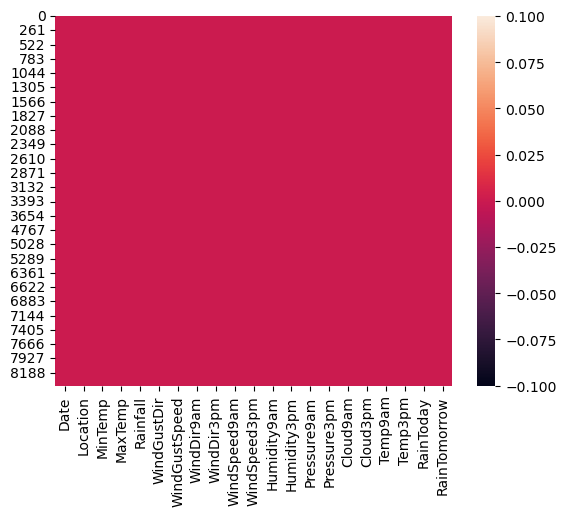

In [61]:
#Checking null value with heat map Visualizing 
sns.heatmap(df.isnull())

**Here you can see no null value is present.**

In [18]:
#Checking the info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6762 non-null   float64
 3   MaxTemp        6762 non-null   float64
 4   Rainfall       6762 non-null   float64
 5   WindGustDir    6762 non-null   object 
 6   WindGustSpeed  6762 non-null   float64
 7   WindDir9am     6762 non-null   object 
 8   WindDir3pm     6762 non-null   object 
 9   WindSpeed9am   6762 non-null   float64
 10  WindSpeed3pm   6762 non-null   float64
 11  Humidity9am    6762 non-null   float64
 12  Humidity3pm    6762 non-null   float64
 13  Pressure9am    6762 non-null   float64
 14  Pressure3pm    6762 non-null   float64
 15  Cloud9am       6762 non-null   float64
 16  Cloud3pm       6762 non-null   float64
 17  Temp9am        6762 non-null   float64
 18  Temp3pm 

**Observation:-**

*1) Here you can see 14 columns contains Float values and 7 columns have the text type values or categorical values.*

*2) This dataset takes 1.1+ MB memory.*

*3) <class 'pandas.core.frame.DataFrame'> indecates that it's the details about the DataFrame.*

*4) Here you can see no column has null values.*

In [19]:
#Changing Date column to DateTime format
df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d")

In [20]:
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

**Now you can see my "Date" column is now datetime format.**

In [21]:
#Checking unique value for each column
df.nunique().to_frame("Unique value counts")

,Unique value counts
Date,3004
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
WindGustDir,16
WindGustSpeed,52
WindDir9am,16
WindDir3pm,16
WindSpeed9am,34


**Observation:-**

*1) Here you can see Location,WindGustDir,WindDir9am,WindDir3pm,Cloud9am,Cloud3pm,RainToday and RainTomorrow column's have high difference between it's value counts toward it's unique value count, those columns are categorical columns.*

In [22]:
#Checking unique value counts of each column
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64


PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64


13.2    128
12.0     57
14.8     53
12.7     53
10.8     52
       ... 
26.6      1
28.0      1
26.9      1
1.4       1
26.0      1
Name: MinTemp, Length: 285, dtype: int64


23.5    99
19.0    66
19.8    62
22.3    54
23.8    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64


0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: R

**Observation:-**

*1) Here you can see no blank value is present.*

*2) Our Target column(RainTomorrow) has a class imbalance issue and we will solve that by using SMOTE() in the later part.*

In [23]:
#Checking description of Dataset
df.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.110086,24.093301,2.723410,38.702159,12.765602,17.562703,67.510500,50.460515,1017.621222,1015.116060,4.519817,4.511979,17.895830,22.700281
std,5.540674,6.130367,10.490138,13.393977,9.789075,9.548883,17.182756,18.498424,6.027923,5.967643,2.492344,2.343253,5.722418,5.972262
min,-2.000000,8.200000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.200000,23.500000,0.000000,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000
75%,17.400000,28.400000,0.800000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


**Observation:-**

*1) For columns "MinTemp","MaxTemp","Humidity9am","Cloud9am", "Cloud3pm" and "Temp9am" these column's median(50%) values are greater than mean ,that means these columns values are left skewed.*

*2) Apart form the column names those are I mentioned above has higher mean value than Midean(50%) that means these column's data has right skewed.*

*3) We can see there is high difference between 75 percentile and Max for MinTemp,MaxTemp,Rainfall, WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity3pm,Temp9am, and Temp3pm columns that means these columns might have outliers.*

*4) Here you can see some columns are missing because they are categorical columns and that's why we can not see their statstical data.*

# Visualization

**Uni-Variate Analysis**

<Axes: xlabel='RainTomorrow', ylabel='count'>

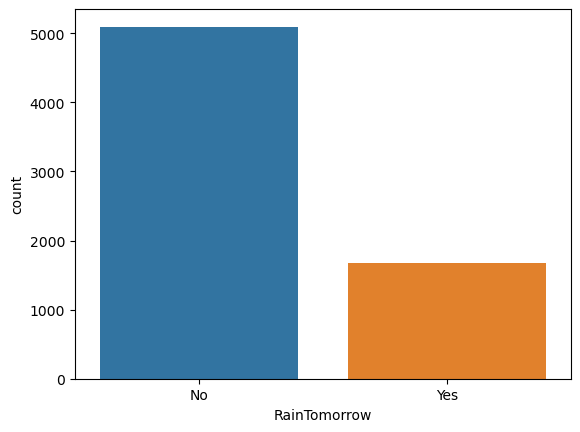

In [24]:
#Analysis of our Target column RainTomorrow
sns.countplot(x="RainTomorrow",data=df)
        

**For most of the time there are no chance for rain Tomorrow.Also there is a class imbalance issue.** 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Albury'),
  Text(1, 0, 'CoffsHarbour'),
  Text(2, 0, 'Newcastle'),
  Text(3, 0, 'Penrith'),
  Text(4, 0, 'Williamtown'),
  Text(5, 0, 'Wollongong'),
  Text(6, 0, 'Melbourne'),
  Text(7, 0, 'Brisbane'),
  Text(8, 0, 'Adelaide'),
  Text(9, 0, 'PerthAirport'),
  Text(10, 0, 'Darwin'),
  Text(11, 0, 'Uluru')])

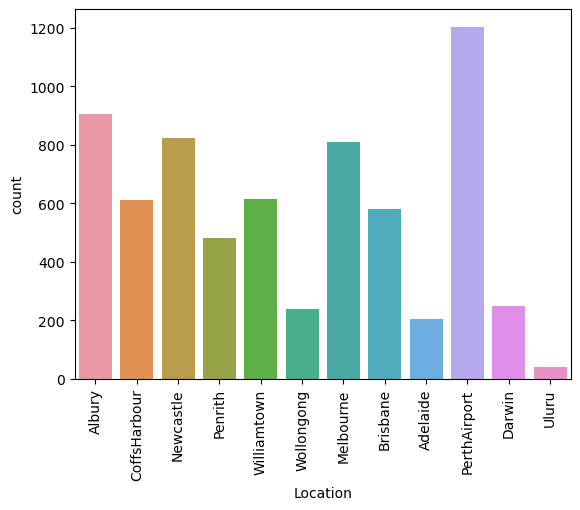

In [25]:
#Analysis of Location column
sns.countplot(x="Location",data=df)
plt.xticks(rotation=90)

**Here you can see most of the weather station data recoded for PerthAirport and least recorded data is present for Uluru.**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'W'),
  Text(1, 0, 'WNW'),
  Text(2, 0, 'WSW'),
  Text(3, 0, 'NE'),
  Text(4, 0, 'NNW'),
  Text(5, 0, 'N'),
  Text(6, 0, 'NNE'),
  Text(7, 0, 'SW'),
  Text(8, 0, 'E'),
  Text(9, 0, 'ENE'),
  Text(10, 0, 'SSE'),
  Text(11, 0, 'S'),
  Text(12, 0, 'NW'),
  Text(13, 0, 'SE'),
  Text(14, 0, 'ESE'),
  Text(15, 0, 'SSW')])

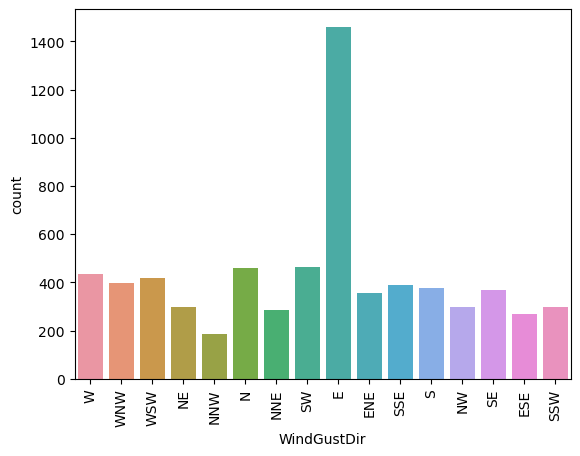

In [26]:
#Analysis of Location column
sns.countplot(x="WindGustDir",data=df)
plt.xticks(rotation=90)

**Here you can see most of the time the direction of the strongest wind gust in the 24 hours to midnight is recorded for East and least time it's recorded for NNE.**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]),
 [Text(0, 0, 'W'),
  Text(1, 0, 'NNW'),
  Text(2, 0, 'SE'),
  Text(3, 0, 'ENE'),
  Text(4, 0, 'SW'),
  Text(5, 0, 'SSE'),
  Text(6, 0, 'S'),
  Text(7, 0, 'NE'),
  Text(8, 0, 'N'),
  Text(9, 0, 'SSW'),
  Text(10, 0, 'WSW'),
  Text(11, 0, 'ESE'),
  Text(12, 0, 'E'),
  Text(13, 0, 'NW'),
  Text(14, 0, 'WNW'),
  Text(15, 0, 'NNE')])

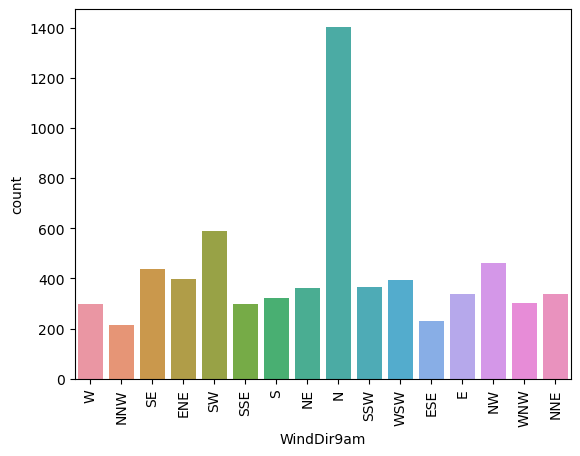

In [27]:
#Analysis of WindDir9am column
sns.countplot(x="WindDir9am",data=df)
plt.xticks(rotation=90)

**Here you can see most of the time the direction of the wind at 9am is recorder for North direction.**

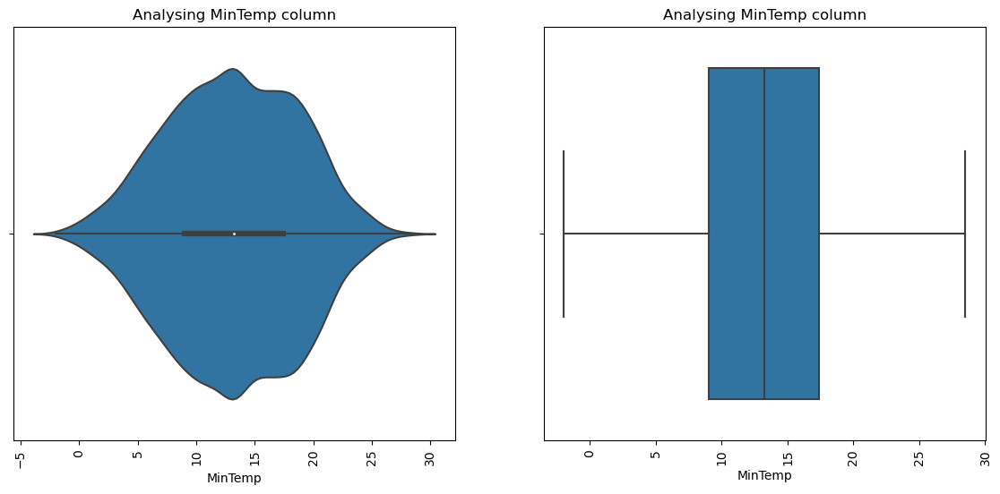

<Figure size 640x480 with 0 Axes>

In [28]:
#Analysis of MinTemp column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="MinTemp",data=df)
plt.xticks(rotation=90)
plt.title("Analysing MinTemp column")

plt.subplot(1,2,2)
sns.boxplot(x="MinTemp",data=df)
plt.xticks(rotation=90)
plt.title("Analysing MinTemp column")
plt.show()
plt.tight_layout()

**Here you can see for maximum time Minimum temperature is lies between 10 to 20 degree celsius where MinTemp column median degree celsius is like 13.5.**

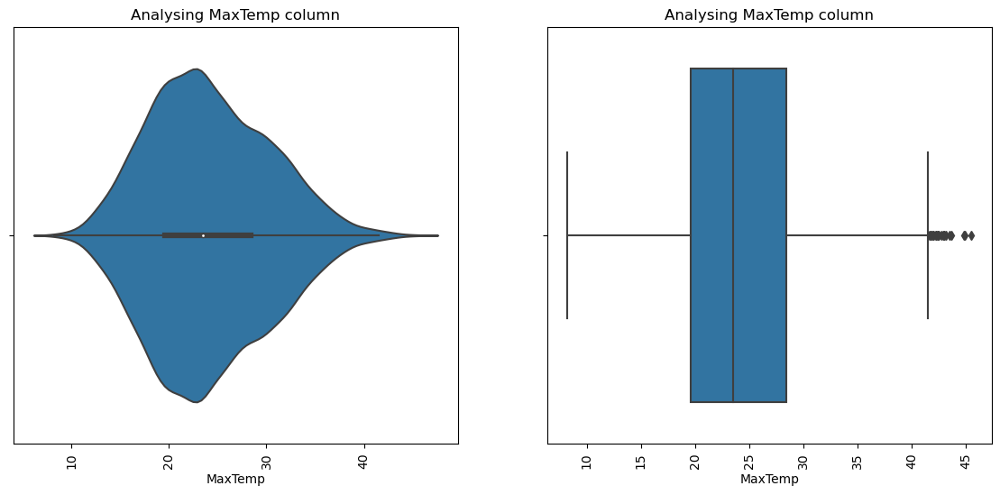

<Figure size 640x480 with 0 Axes>

In [29]:
#Analysis of MaxTemp column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="MaxTemp",data=df)
plt.xticks(rotation=90)
plt.title("Analysing MaxTemp column")

plt.subplot(1,2,2)
sns.boxplot(x="MaxTemp",data=df)
plt.xticks(rotation=90)
plt.title("Analysing MaxTemp column")
plt.show()
plt.tight_layout()

**Here you can see for maximum time Maximum temperature is lies between 15 to 25 degree celsius where MaxTemp column median degree celsius is like 24.**

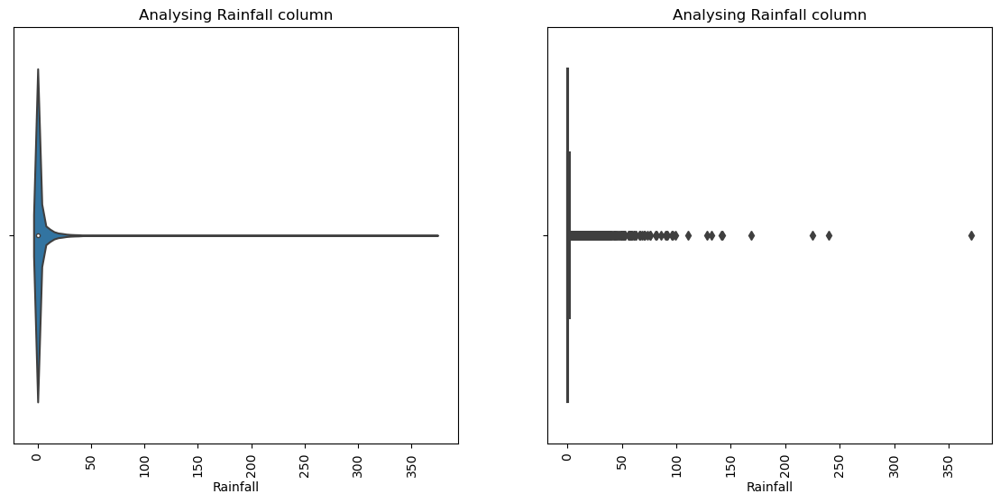

<Figure size 640x480 with 0 Axes>

In [30]:
#Analysis of Rainfall column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Rainfall",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Rainfall column")

plt.subplot(1,2,2)
sns.boxplot(x="Rainfall",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Rainfall column")
plt.show()
plt.tight_layout()

**Here you can see most of the time Rainfall is recorded between 0 to 1mm.Also in this column some outliers are present.**

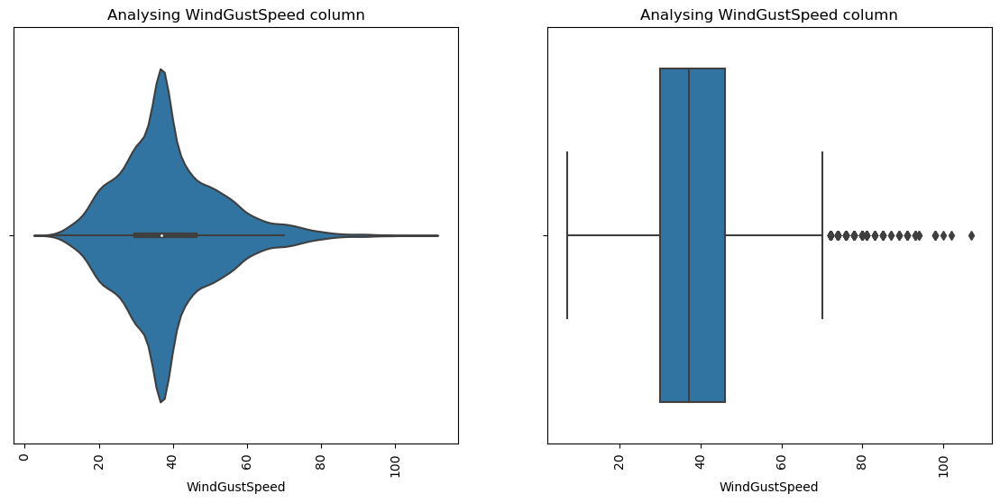

<Figure size 640x480 with 0 Axes>

In [31]:
#Analysis of WindGustSpeed column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="WindGustSpeed",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindGustSpeed column")

plt.subplot(1,2,2)
sns.boxplot(x="WindGustSpeed",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindGustSpeed column")
plt.show()
plt.tight_layout()

**Observation:-**

*1) For most of the time the speed (km/h) of the strongest wind gust in the 24 hours to midnight is lies between 35 km/h to 45 km/h.*

*2) Median of WindGustSpeed column is like 35 km/h.*

*3) Also there are some outliers are present in WindGustSpeed column.*

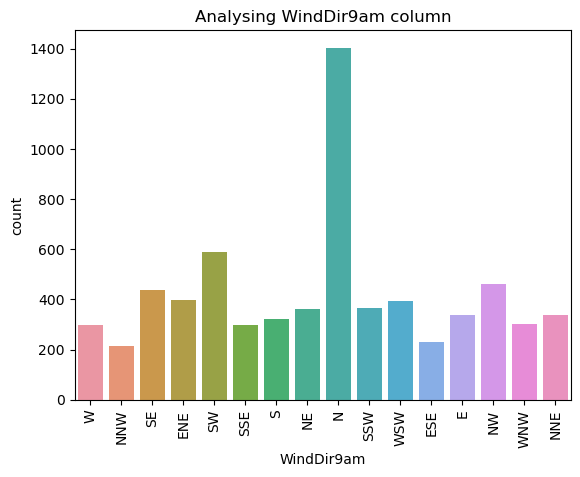

In [32]:
#Analysis of WindDir9am column
sns.countplot(x="WindDir9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindDir9am column")
plt.show()


**Observation:-**
    
*1) Here you can see direction of the wind is North side mostly at 9am*

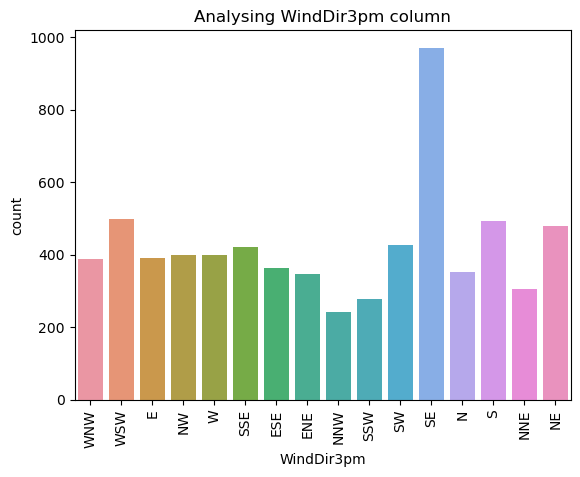

In [33]:
#Analysis of WindDir3pm column
sns.countplot(x="WindDir3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindDir3pm column")
plt.show()

**Observation:-**

*1) Most of the time at 3PM the wind direction is SE.* 

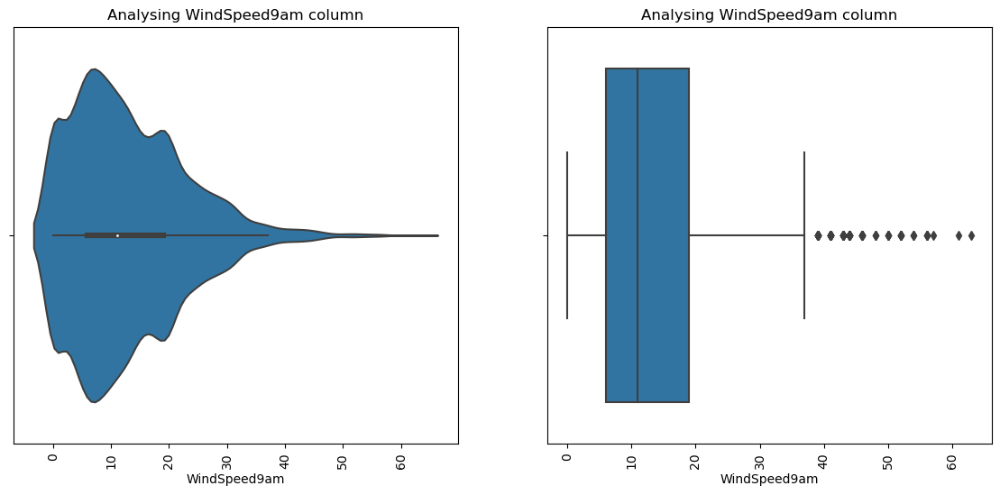

<Figure size 640x480 with 0 Axes>

In [34]:
#Analysis of WindSpeed9am column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="WindSpeed9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindSpeed9am column")

plt.subplot(1,2,2)
sns.boxplot(x="WindSpeed9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindSpeed9am column")
plt.show()
plt.tight_layout()

**Observation:-**
    
*1) Most of the time Wind speed (km/hr) is recorded between 5(km/hr) to 15(km/hr) averaged over 10 minutes prior to 9am.*

*2) There are outliers present in WindSpeed9am column and median of WindSpeed9am column is like 11.5(km/hr).*

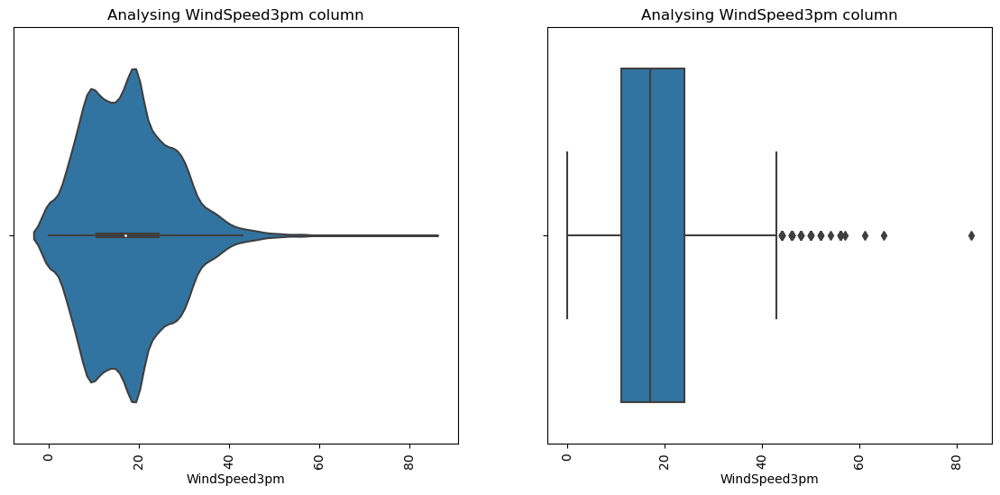

<Figure size 640x480 with 0 Axes>

In [35]:
#Analysis of WindSpeed3pm column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="WindSpeed3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindSpeed3pm column")

plt.subplot(1,2,2)
sns.boxplot(x="WindSpeed3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing WindSpeed3pm column")
plt.show()
plt.tight_layout()

**Observation:-**

*1) Most of the time Wind speed (km/hr) is recorded between 10(km/hr) to 22(km/hr) averaged over 10 minutes prior to 3pm.*

*2) There are outliers present in WindSpeed3pm column and median of WindSpeed9am column is like 18(km/hr).*

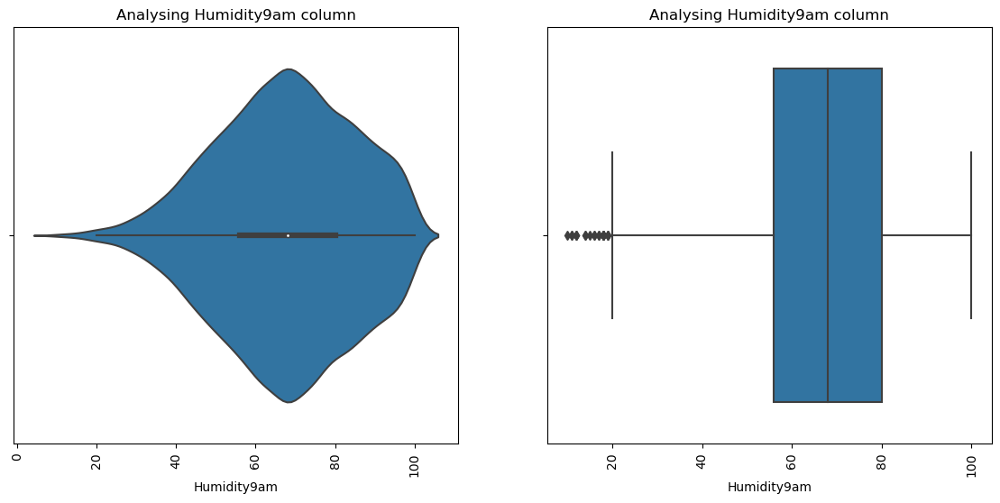

<Figure size 640x480 with 0 Axes>

In [36]:
#Analysis of Humidity9am column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Humidity9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Humidity9am column")

plt.subplot(1,2,2)
sns.boxplot(x="Humidity9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Humidity9am column")
plt.show()
plt.tight_layout()

**Observation:-**
    
*1) From maximum time Humidity (percent) at 9am lies between 60 to 80%.*

*2) Humidity9am column has also outliers and median of the Humidity9am column is like 70%.*

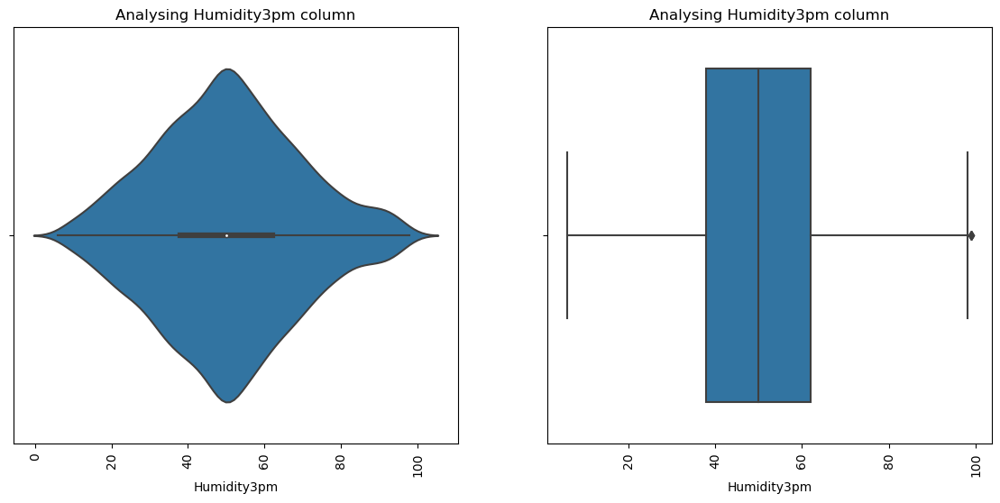

<Figure size 640x480 with 0 Axes>

In [37]:
#Analysis of Humidity3pm column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Humidity3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Humidity3pm column")

plt.subplot(1,2,2)
sns.boxplot(x="Humidity3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Humidity3pm column")
plt.show()
plt.tight_layout()

**Observation:-**

*1) Maximum time Humidity (percent) at 3pm lies between 40 to 60%.*

*2) Humidity3pm column has also outliers and median of the Humidity9am column is like 50%.*

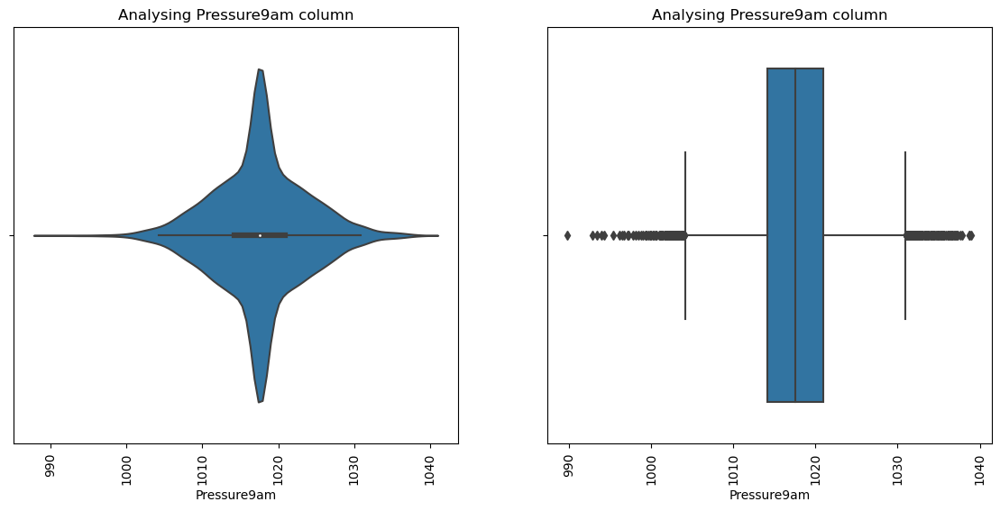

<Figure size 640x480 with 0 Axes>

In [38]:
#Analysis of Pressure9am column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Pressure9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Pressure9am column")

plt.subplot(1,2,2)
sns.boxplot(x="Pressure9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Pressure9am column")
plt.show()
plt.tight_layout()

**Observation:-**

*1) Maximum time Atmospheric pressure (hpa) reduced to mean sea level at 9am to 1010 to 1030.*

*2) Median of Atmospheric pressure (hpa) reduced to mean sea level at 9am is like 1018 and Pressure9am column also have outliers.*


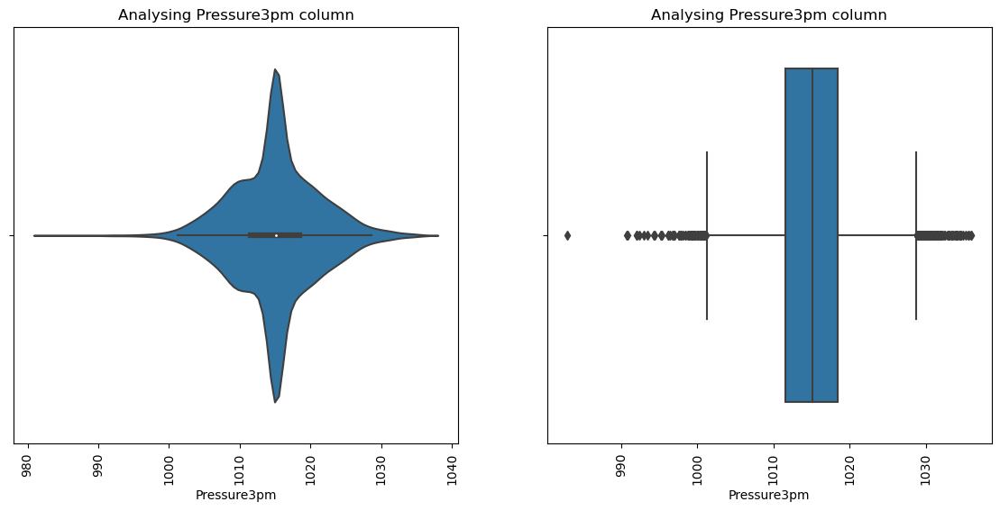

<Figure size 640x480 with 0 Axes>

In [39]:
#Analysis of Pressure3pm column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Pressure3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Pressure3pm column")

plt.subplot(1,2,2)
sns.boxplot(x="Pressure3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Pressure3pm column")
plt.show()
plt.tight_layout()

**Observation:-**

*1) Maximum time Atmospheric pressure (hpa) reduced to mean sea level at 3pm lies between 1014 to 1018.*

*2) Median of Atmospheric pressure (hpa) reduced to mean sea level at 3pm is like 1015 and Pressure3pm column also have outliers.*

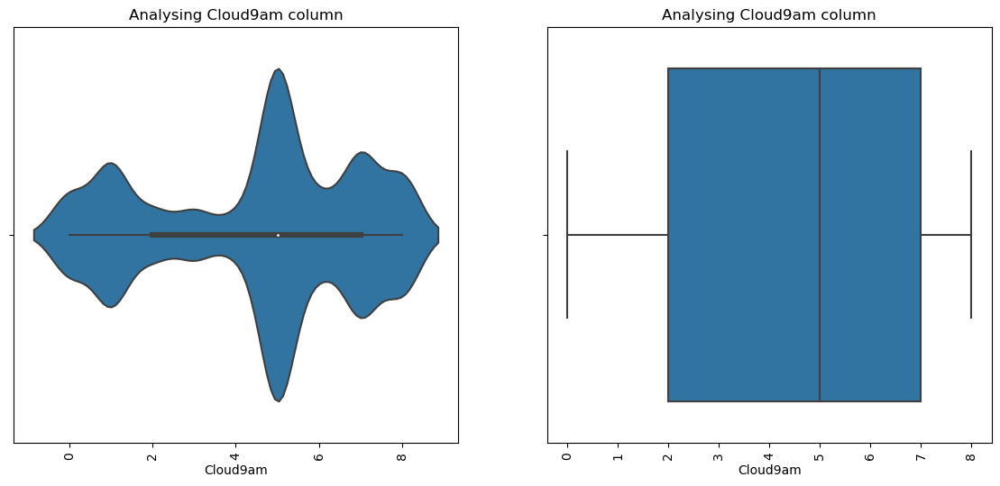

<Figure size 640x480 with 0 Axes>

In [40]:
#Analysis of Cloud9am column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Cloud9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Cloud9am column")

plt.subplot(1,2,2)
sns.boxplot(x="Cloud9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Cloud9am column")
plt.show()
plt.tight_layout()

**Observation:-**
    
*1) Here you can see at 9am most of the time Cloud rating is between 4 to 6 means most of the time cloud is obstructed the sky over 60%.Here 0 means no cloud occlution and 8 means fully occluded sky.*

*2) Median for Cloud9am is 5 that means maximum time cloud cover the sky of 60%.*

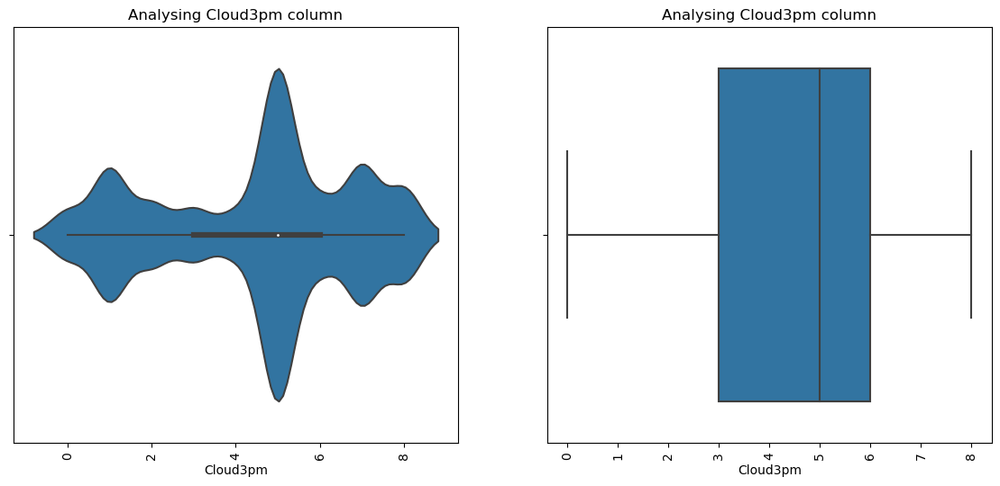

<Figure size 640x480 with 0 Axes>

In [41]:
#Analysis of Cloud3pm column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Cloud3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Cloud3pm column")

plt.subplot(1,2,2)
sns.boxplot(x="Cloud3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Cloud3pm column")
plt.show()
plt.tight_layout()

**Observation:-**
    
*1) For 3pm also there is no change of cloud occluness.*


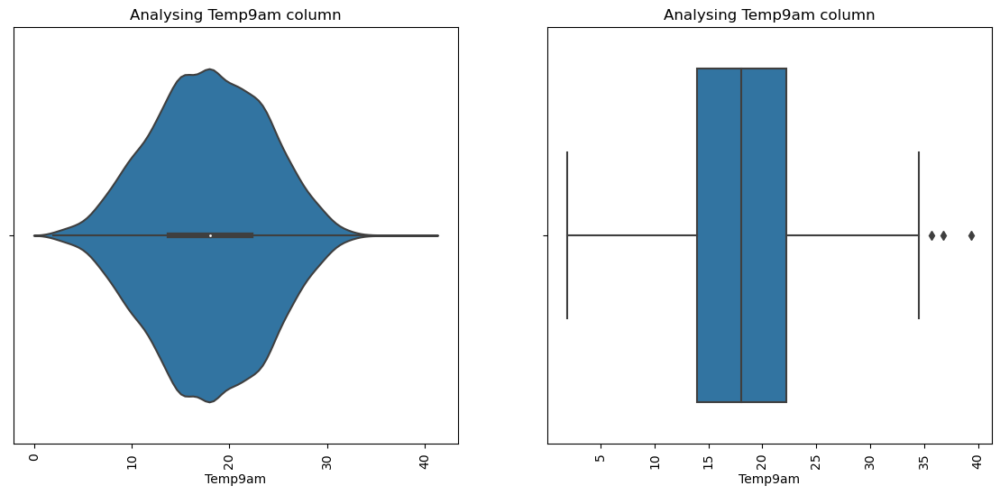

<Figure size 640x480 with 0 Axes>

In [42]:
#Analysis of Temp9am column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Temp9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Temp9am column")

plt.subplot(1,2,2)
sns.boxplot(x="Temp9am",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Temp9am column")
plt.show()
plt.tight_layout()

**Observation:-**
    
*1) Here you can see at 9 am most of the time the temperatues are lies between 15 to 22*

*2) The median of Temp9am column is 17.5.*

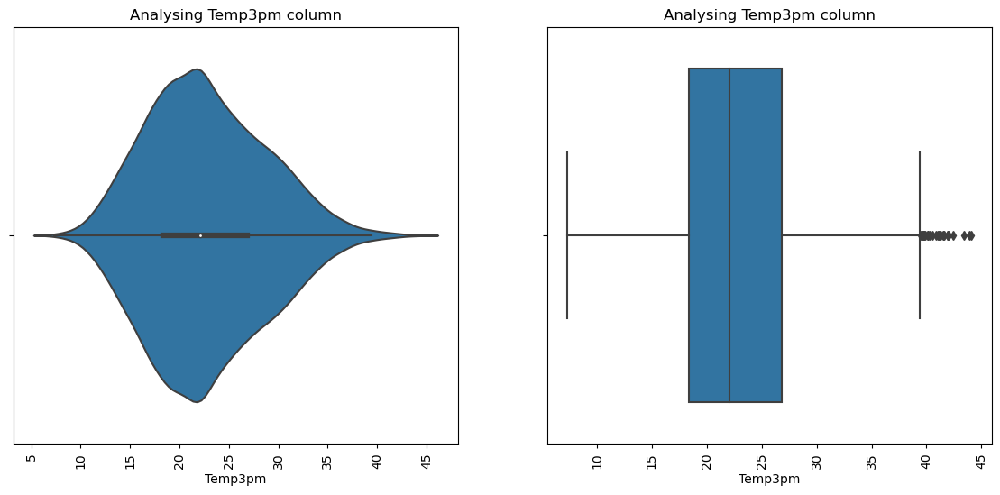

<Figure size 640x480 with 0 Axes>

In [43]:
#Analysis of Temp3pm column
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.violinplot(x="Temp3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Temp3pm column")

plt.subplot(1,2,2)
sns.boxplot(x="Temp3pm",data=df)
plt.xticks(rotation=90)
plt.title("Analysing Temp3pm column")
plt.show()
plt.tight_layout()

**Observation:-**

*1) Here you can see at 9 am most of the time the temperatues are lies between 17.5 to 25.*

*2) The median of Temp9am column is 22.*

**Bivariate Analysis**

<Axes: xlabel='Date', ylabel='MinTemp'>

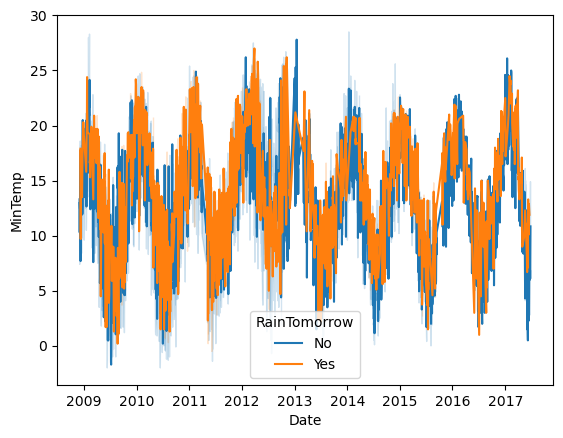

In [44]:
#Analysisng MinTemp column whit our Target column RainTomorrow
sns.lineplot(x="Date",y="MinTemp",hue="RainTomorrow",data=df)

**Observation:-**
    
*Here you can see for 2013 and 2014 if the minimum temperature is going above 20 there is high chance that there will be no rain.*

<Axes: xlabel='Date', ylabel='MaxTemp'>

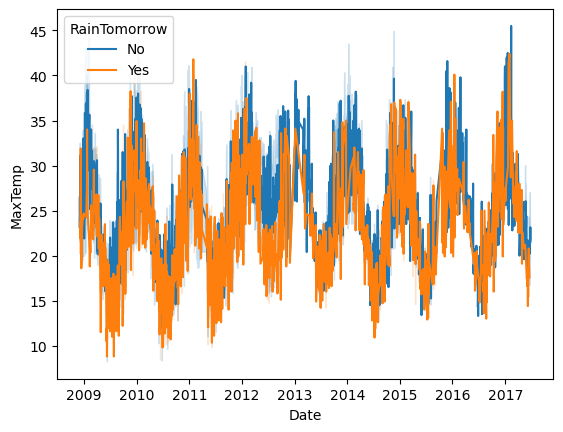

In [45]:
#Analysisng MaxTemp column whit our Target column RainTomorrow
sns.lineplot(x="Date",y="MaxTemp",hue="RainTomorrow",data=df)

**Observation:-**
    
*Here you can see for 2009,2010,2012,2013,2014 and 2016 if the maximum temperature is going above 35 then there is high chance that there will be no rain.*

<Axes: xlabel='WindGustDir', ylabel='Rainfall'>

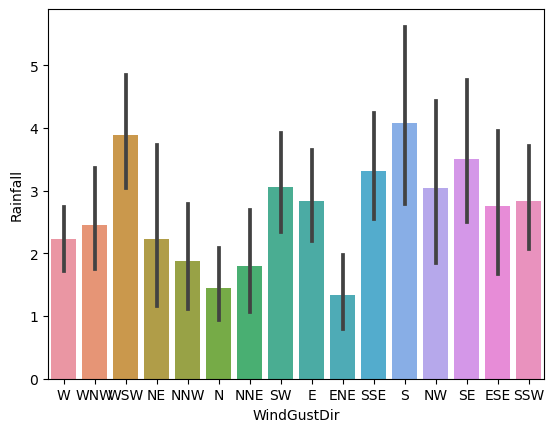

In [46]:
#Analysis WindGustDir column with our 2nd question's Target column
sns.barplot(x="WindGustDir",y="Rainfall",data=df)

**Observation:-**
    
*1) Here you can see where the wind direction is is south or WSW there Rain happens like above 3.75MM.*

*2) Where wind direction is ENE or N there will be less rain happens like 1.5MM.*


<Axes: xlabel='WindGustDir', ylabel='WindGustSpeed'>

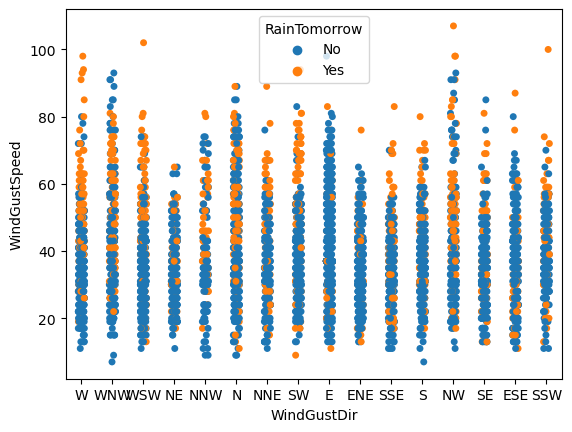

In [47]:
#Analysis WindGustDir column with WindGustSpeed regarding our Target column RainTomorrow
sns.stripplot(x="WindGustDir",y="WindGustSpeed",data=df,hue="RainTomorrow")

**Observation:-**
    
*1) Here you can see if the wind speed increases there is a high chance of Rain Tomorrow.*

<Axes: xlabel='WindGustSpeed', ylabel='Rainfall'>

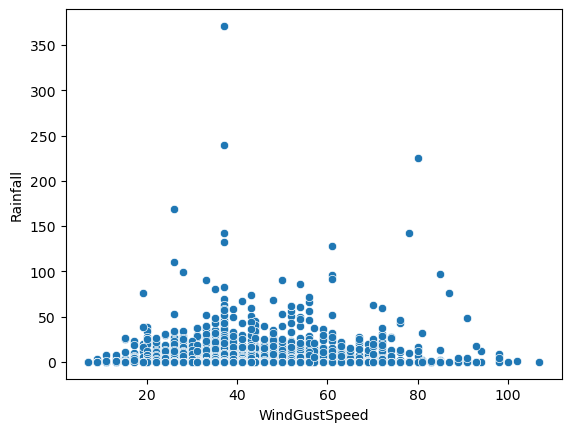

In [48]:
#Analysis WindGustSpeed column and Rainfall column with our 2nd question's Target column
sns.scatterplot(x="WindGustSpeed",y="Rainfall",data=df)

**Observation:-**
    
*Here you can see if the Wind speen is between 35 to 60 there will be high chance of heavy rain.*

<Axes: xlabel='WindGustDir', ylabel='Humidity9am'>

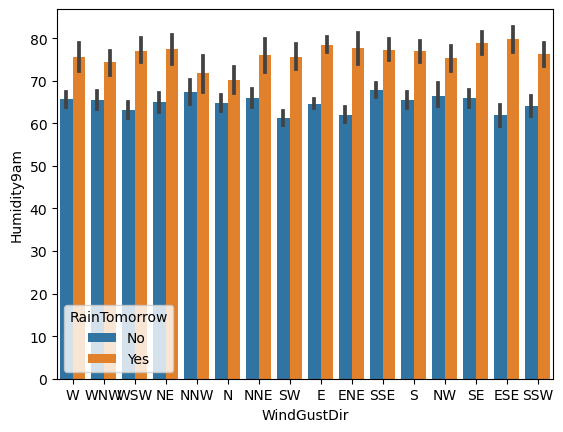

In [49]:
#Analysis Humidity9am column with WindGustDir regarding our Target column RainTomorrow
sns.barplot(x="WindGustDir",y="Humidity9am",data=df,hue="RainTomorrow")

**Observation:-**

*1) Here you can see if at 9am Humidity is increased above 65 there will be a posibilty for rain tomorrow.*

<Axes: xlabel='WindGustDir', ylabel='Humidity3pm'>

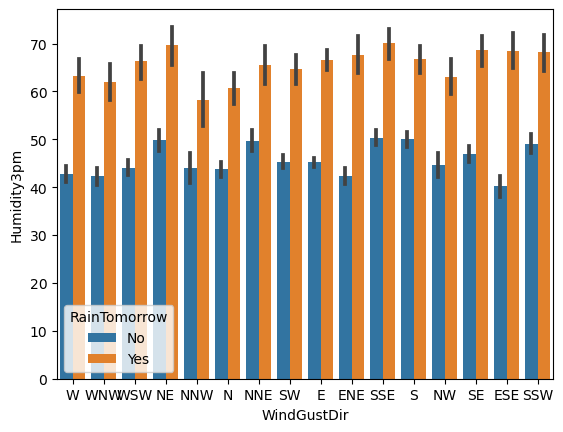

In [50]:
#Analysis Humidity9am column with WindGustDir regarding our Target column RainTomorrow
sns.barplot(x="WindGustDir",y="Humidity3pm",data=df,hue="RainTomorrow")

**Observation:-**

*1) At 3pm if Humidity is increased above 50 there will be a always for rain tomorrow.*

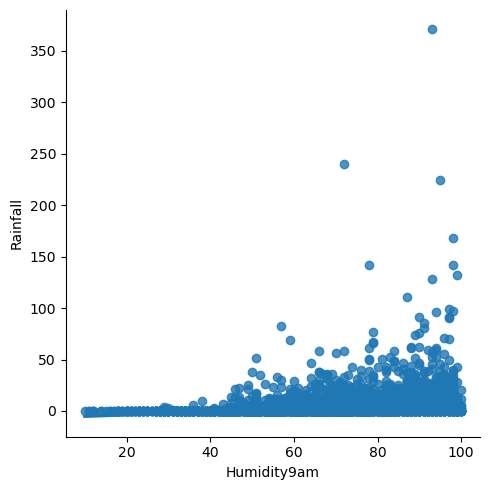

In [51]:
#Analysis Humidity9am column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="Humidity9am",y="Rainfall",data=df)

**Observation:-**
    
*1) Here you can see if the Humidity increases for 9am data the rainfall is also increases.*

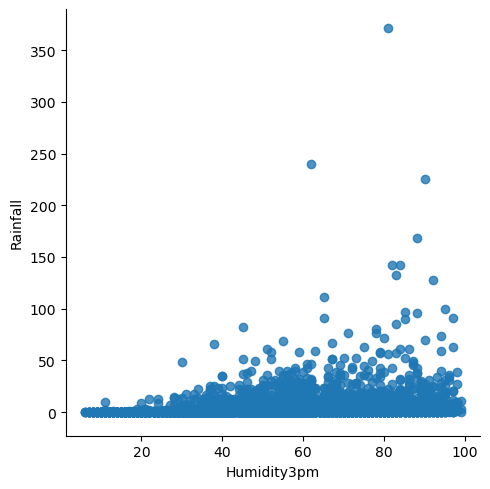

In [52]:
#Analysis Humiditypmm column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="Humidity3pm",y="Rainfall",data=df)

**Observation:-**

*1) Here you can see if the Humidity increases for 3pm data the rainfall is also increases.*

<Axes: xlabel='WindGustDir', ylabel='Pressure9am'>

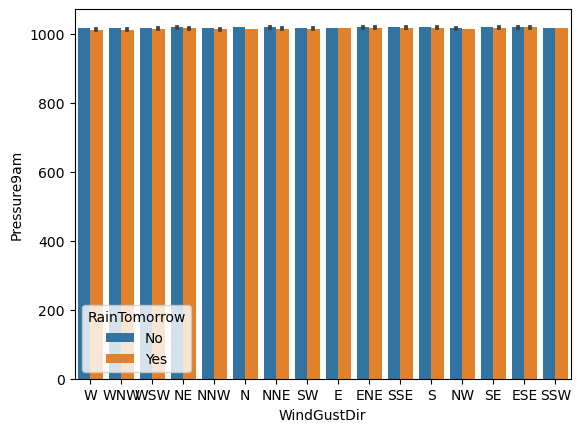

In [53]:
#Analysis Pressure9am column with WindGustDir regarding our Target column RainTomorrow
sns.barplot(x="WindGustDir",y="Pressure9am",data=df,hue="RainTomorrow")

**Observation:-**
    
*1) Here you can see Pressure will not give any impact towards Tomorrow rain prediction.*

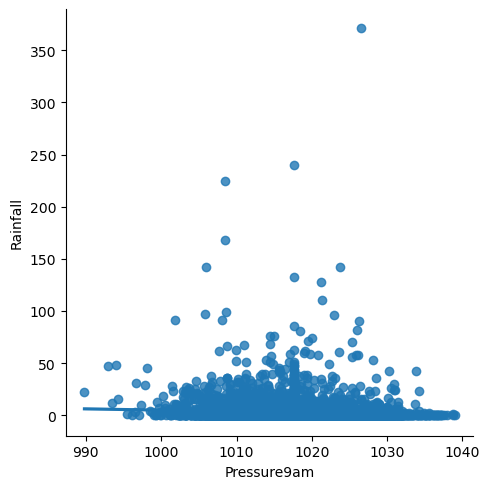

In [54]:
#Analysis Pressure9am column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="Pressure9am",y="Rainfall",data=df)

**Observation:-**
    
*1) If the pressure is lie between 1010 to 1020 the rainfall will also increase.*

<Axes: xlabel='WindGustDir', ylabel='Cloud9am'>

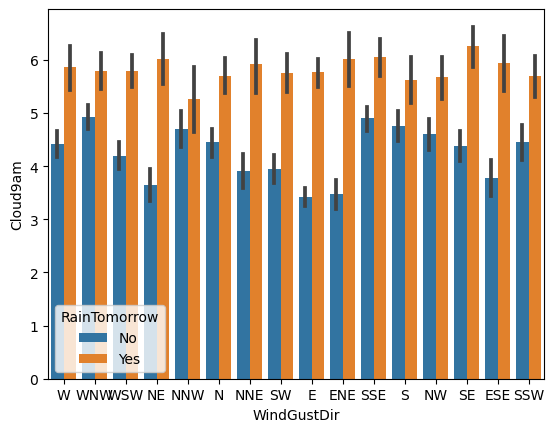

In [55]:
#Analysis Pressure9am column with WindGustDir regarding our Target column RainTomorrow
sns.barplot(x="WindGustDir",y="Cloud9am",data=df,hue="RainTomorrow")

**Observation:-**
    
*1) Here you can see if the cloud count crosses 5 mark that means means above 65% of sky is occluded by cloud then there will be high chance of rain tomorrow.*

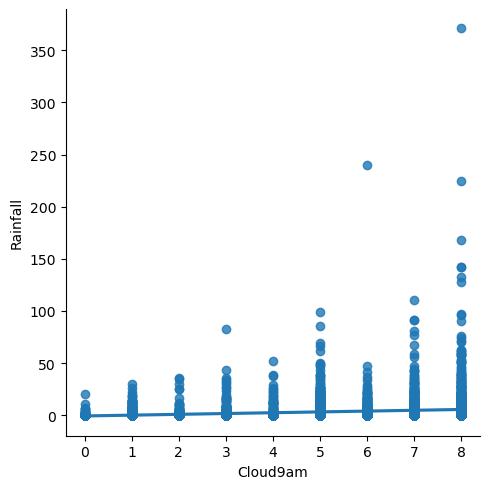

In [56]:
#Analysis Cloud9am column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="Cloud9am",y="Rainfall",data=df)

**Observation:-**
    
*1) Here you can see if the Cloud mark is 8 then there will be heavy rain.8 means whole sky is covered with cloud.*

<Axes: xlabel='WindGustDir', ylabel='Temp9am'>

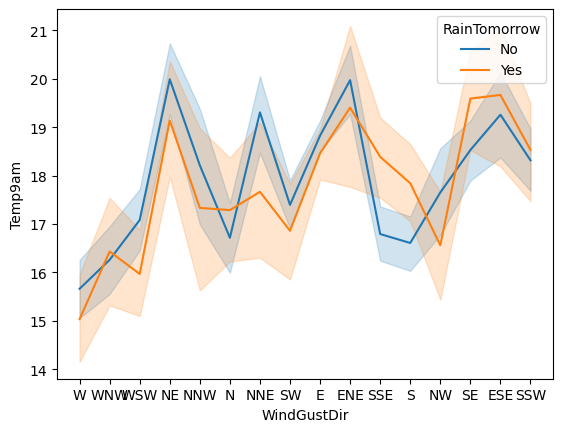

In [57]:
#Analysis Temp9am column with WindGustDir regarding our Target column RainTomorrow
sns.lineplot(x="WindGustDir",y="Temp9am",data=df,hue="RainTomorrow")

**Observation:-**
    
*1) Here you can see we can not clearly give any trand for this graph.*

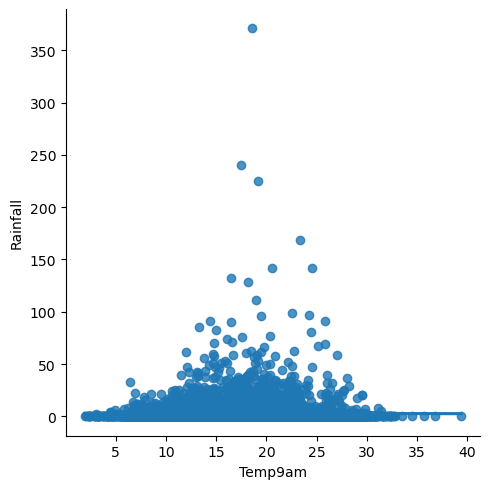

In [58]:
#Analysis Temp9am column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="Temp9am",y="Rainfall",data=df)

**Observation:-**
    
*1) Here you can see if the temperature is lies between 15 to 25 then rainfall will gets heavy.*

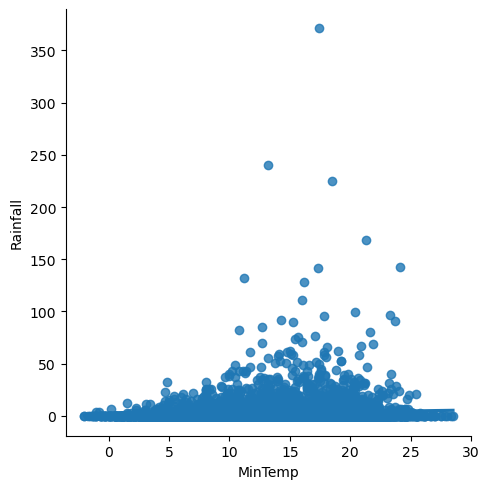

In [63]:
#Analysis MinTemp column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="MinTemp",y="Rainfall",data=df)

**Observation:-**

*1) Here you can see if the minimum temperature is increases then the rainfall will get heaver.*

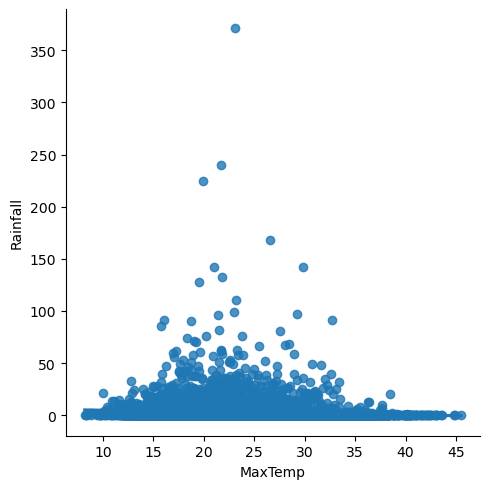

In [64]:
#Analysis MaxTemp column with Rainfall column that is also our 2nd question's Target column
sns.lmplot(x="MaxTemp",y="Rainfall",data=df)

**Observation:-**

*1) As like minimum temperature if the maximum temperature is increases then the rainfall will get heaver.*

**Multivatiate Analysis**

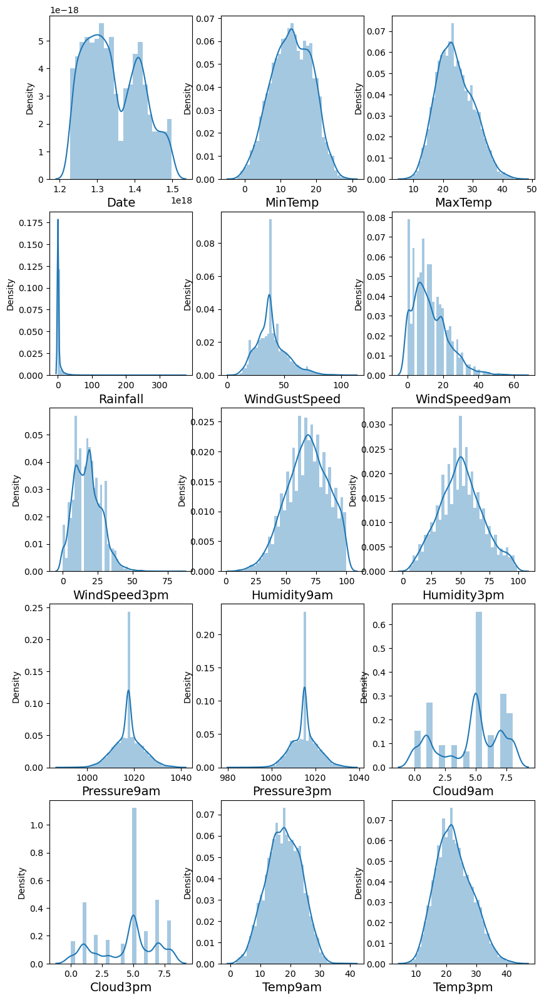

<Figure size 640x480 with 0 Axes>

In [59]:
#Data distribution for all numerical columns
plt.figure(figsize=(10,40))
p=1
for i in df.columns:
    if p<30:
        
        if df[i].dtypes=="object":
            continue
            
        plt.subplot(10,3,p)
        sns.distplot(x=df[i])
        plt.xlabel(i,fontsize=14)
        
    p+=1
    
plt.show()
plt.tight_layout()
        
        

**Observation:-**
    
*Here youcan see most of the columns are look like almost normally distributed.*

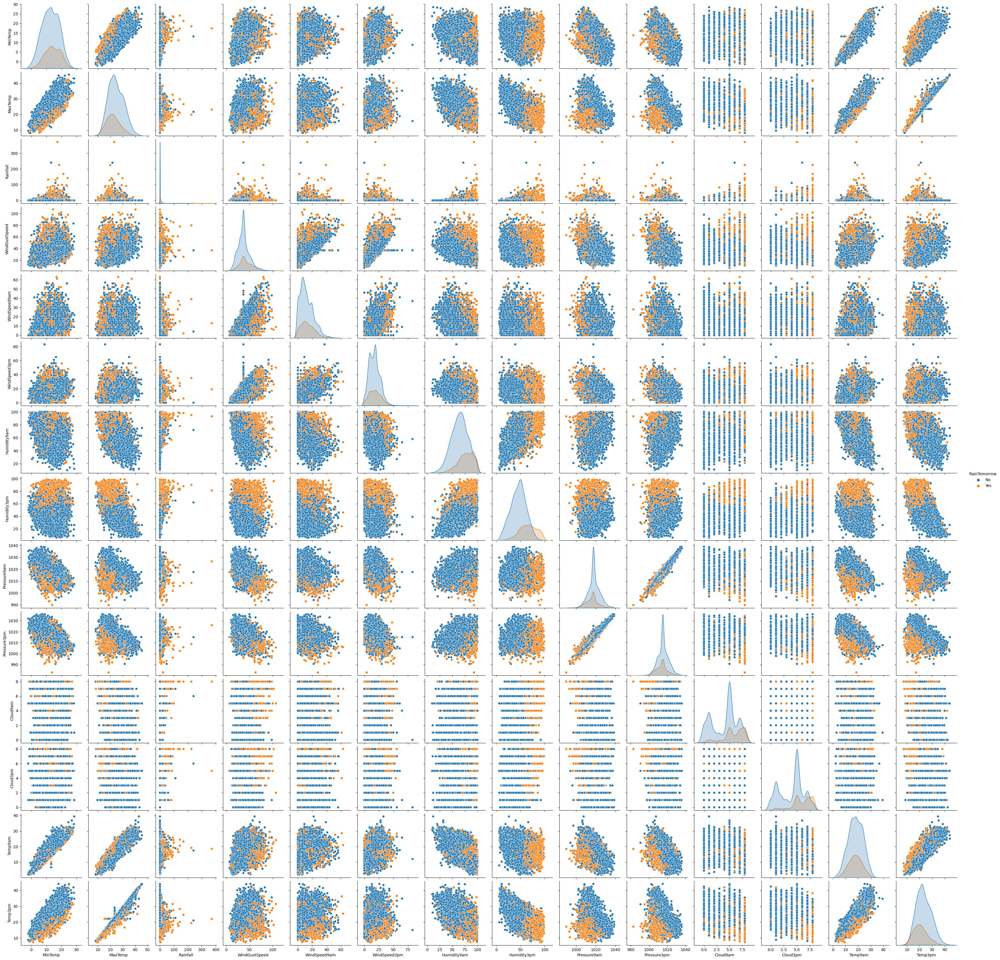

In [60]:
#Pairplot
sns.pairplot(df,hue="RainTomorrow")

**Observation:-**
    
*1) Here you can see all columns relation and their behaiver with wach other.*

# Deleting Unnecessary Columns

**Here you can see Date and Location will not help me for predicting Rainfall or RainTomorrow so I will delete these columns.**

In [66]:
df.drop(["Date","Location"],axis=1,inplace=True)

In [67]:
df

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.4,0.0,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,No,No
8421,3.6,25.3,0.0,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,No,No
8422,5.4,26.9,0.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,No,No
8423,7.8,27.0,0.0,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


**Now you can see "Date" and "Location" column is deleted.**

# Checking for outliers

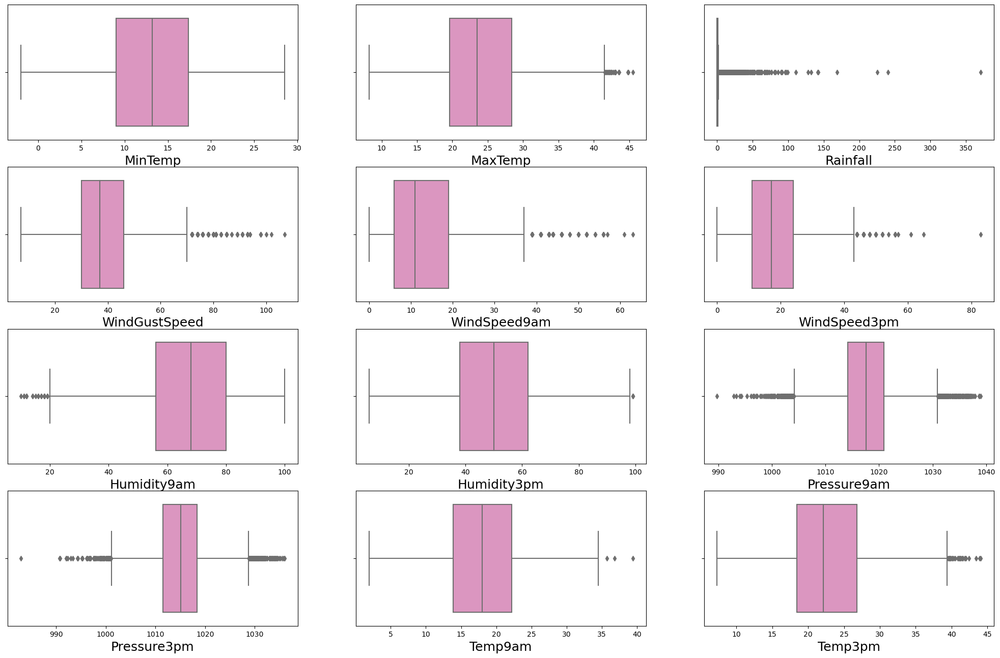

<Figure size 640x480 with 0 Axes>

In [71]:
#Avoiding RainTomorrow column because it's my Target column and avoiding all other categorical columns
#Apart from "WindGustDir","WindDir9am","WindDir3pm","Cloud9am","Cloud3pm","RainToday" these columns all are ordinal columns and I have to check outliers from those ordinal columns
out=df[["MinTemp","MaxTemp","Rainfall","WindGustSpeed","WindSpeed9am","WindSpeed3pm","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm","Temp9am","Temp3pm"]]
plt.figure(figsize=(25,20),facecolor="white")
p=1
for i in out:
        if p<=20:
        
            
            plt.subplot(5,3,p)
            sns.boxplot(x=df[i],palette="Set2_r",data=df)
            plt.xlabel(i,fontsize=18)
            plt.yticks(rotation=0,fontsize=18)
            p+=1
plt.show()
plt.tight_layout()

**Observation:-**
    
*Here you can see appart from MinTemp column all columns has outliers and we have to remove those.*

# Removing outliers

In [72]:
out=df[["MinTemp","MaxTemp","Rainfall","WindGustSpeed","WindSpeed9am","WindSpeed3pm","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm","Temp9am","Temp3pm"]]
from scipy.stats import zscore

z=np.abs(zscore(out))
z

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.052329,0.194668,0.202435,0.395568,0.739082,0.674191,0.203097,1.538651,1.645999,1.343353,0.174035,0.150755
1,1.030652,0.164227,0.259635,0.395568,0.895514,0.464727,1.368362,1.376463,1.164869,1.226045,0.121606,0.267878
2,0.037920,0.262108,0.259635,0.544900,0.636920,0.883655,1.717576,1.106150,1.662590,1.075221,0.542498,0.083680
3,0.705758,0.637317,0.259635,1.097751,0.180378,0.896789,1.310160,1.863027,0.003521,0.388132,0.035682,0.636275
4,0.792365,1.338795,0.164301,0.171570,0.589027,0.255263,0.843321,0.943962,1.131688,1.527694,0.016748,1.172125
...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.860937,0.113101,0.259635,0.575089,0.023947,0.687325,0.960947,1.430526,1.157828,0.868739,1.362432,0.050283
8421,1.716540,0.196854,0.259635,1.247082,0.023947,0.896789,0.669936,1.592714,0.975330,0.667639,1.222621,0.301369
8422,1.391646,0.457869,0.259635,0.127093,0.384702,0.896789,0.844543,1.430526,0.560563,0.282199,0.942998,0.569294
8423,0.958453,0.474183,0.259635,0.799087,0.023947,1.106253,0.960947,1.430526,0.295112,0.231924,0.488611,0.552548


In [73]:
#Finding outliets location
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  928,  935,  949,  979,  980,
         980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1189, 1202,
        1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480,
        1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680, 1774, 1819,
        1873, 1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108, 2116, 2186,
        2201, 2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500, 2505, 2527,
        2527, 2541, 2593, 2676, 2677, 2735, 2849, 2859, 2890, 2898, 2900,
        2900, 2901, 2909, 3003, 3027, 3051, 3051, 3055, 3058, 3059, 3059,
        3060, 3066, 3067, 3067, 3067, 3068, 3070, 3082, 3082, 3082, 3089,
        3089, 3099, 3099, 3141, 3153, 

In [74]:
#Checking outliers by giving row and column number
z.iloc[8,3]

3.0835422168793576

**Here you can see by giving row and column location we can see the zscore value is above 3 that means it's an outlier.**

# Creating a outlier free dataset

In [75]:
new_df=df[(z<3).all(axis=1)]
new_df.shape

(6458, 19)

In [76]:
print("Old DataFrame",df.shape[0])
print("New DataFrame",new_df.shape[0])

Old DataFrame 6762
New DataFrame 6458


**Here you can see 304 rows has been deleted because those have outliers.**

In [77]:
print("Data lost percentage after appliing zscore:-",((df.shape[0]-new_df.shape[0])/df.shape[0])*100)

Data lost percentage after appliing zscore:- 4.495711328009465


**Here you can see our data lost percentage is 4 and we can afford it.**

# Checking Data Distribution for each column again

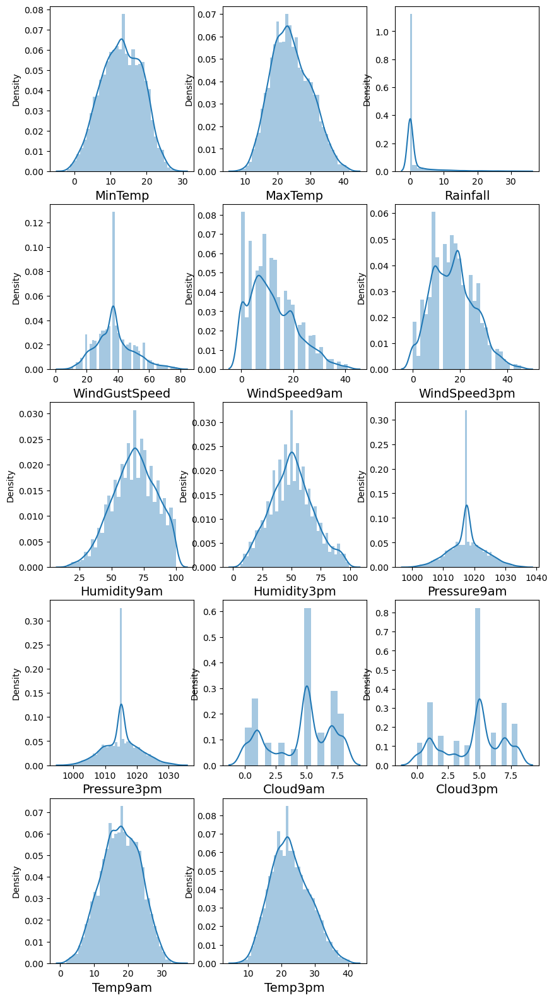

<Figure size 640x480 with 0 Axes>

In [78]:
#Data distribution for all numerical columns
plt.figure(figsize=(10,40))
p=1
for i in new_df.columns:
    if p<30:
        
        if new_df[i].dtypes=="object":
            continue
            
        plt.subplot(10,3,p)
        sns.distplot(x=new_df[i])
        plt.xlabel(i,fontsize=14)
        
    p+=1
    
plt.show()
plt.tight_layout()

**Observation:-**
    
*Here you can see there is no much change for the data distribution after the removal of skewness also.*

# Checking for skewness

In [79]:
new_df.skew().to_frame("Skewness values")

,Skewness values
MinTemp,-0.083407
MaxTemp,0.266125
Rainfall,3.521080
WindGustSpeed,0.545963
WindSpeed9am,0.685188
WindSpeed3pm,0.342797
Humidity9am,-0.230721
Humidity3pm,0.159848
Pressure9am,0.062138
Pressure3pm,0.089852


**Observation:-**

*1) You can see our acceptable skewness value range is +0.5 to -0.5.But Here we all know apart from "Rainfall"and "WindSpeed9am" all columns are in our acceptable range.**

*2) So I have to try to reduce the skewness of "Rainfall"and "WindSpeed9am" columns.*

# Reducing Skewness

In [80]:
#Trying to reduce skewness using cube root method
a=new_df["Rainfall"]
b=new_df["WindSpeed9am"]

a=np.cbrt(a)
b=np.cbrt(b)


print("Rainfall skewness:",a.skew())
print("WindSpeed9am skewness:",b.skew())

Rainfall skewness: 1.5075763770925572
WindSpeed9am skewness: -1.1744287138704554


**cbrt not working.Trying other method.**

In [81]:
#Trying to reduce skewness using square root method
a=new_df["Rainfall"]
b=new_df["WindSpeed9am"]

a=np.sqrt(a)
b=np.sqrt(b)


print("Rainfall skewness:",a.skew())
print("WindSpeed9am skewness:",b.skew())

Rainfall skewness: 2.049002660567221
WindSpeed9am skewness: -0.4812132778452711


**Here you can see by using sqrt I can reduce the WindSpeed9am columns skewness so I will implement it permanently on this column.**

In [82]:
#Implementing sqrt on WindSpeed9am column permanently
new_df["WindSpeed9am"]=np.sqrt(new_df["WindSpeed9am"])

In [83]:
#Checking the skewness again
new_df.skew().to_frame("Skewness values")

,Skewness values
MinTemp,-0.083407
MaxTemp,0.266125
Rainfall,3.521080
WindGustSpeed,0.545963
WindSpeed9am,-0.481213
WindSpeed3pm,0.342797
Humidity9am,-0.230721
Humidity3pm,0.159848
Pressure9am,0.062138
Pressure3pm,0.089852


**Now you can see WindSpeed9am column skewness is reduced to our acceptable range.Trying other method's for Rainfall column**

In [84]:
#Trying to reduce skewness using log method
a=new_df["Rainfall"]

a=np.log(a)

print("Rainfall skewness:",a.skew())

Rainfall skewness: nan


**log is not working.Applying other methods.**

In [85]:
#Trying to reduce skewness using log1p method
a=new_df["Rainfall"]

a=np.log1p(a)

print("Rainfall skewness:",a.skew())

Rainfall skewness: 1.8443106791313084


**Not working.**

In [86]:
#using PowerTransformer to reduce the skewness
from sklearn.preprocessing import PowerTransformer

pt=PowerTransformer("yeo-johnson")   #yeo-johnson method works on both positive and Negative method

a=new_df["Rainfall"]


#Reshaping the columns because power transformar need 2d array instead 1d
a_reshape=a.values.reshape(-1,1)


#Now fitting the Transformer
a_transform=pt.fit_transform(a_reshape)


#Convert the transformed array back to the DataFrame
a=pd.DataFrame(a_transform)

print("Rainfall skewness:",a.skew())



Rainfall skewness: 0    1.069031
dtype: float64


**Still the skewness is out of our acceptable range.**

In [88]:
#Appliing boxcox to Rainfall 
from scipy.stats import boxcox
try:
    

    a=new_df["Rainfall"]

    a=boxcox(a)

    print("Rainfall skewness:",a.skew())
    
except:
    print("Data must be positive.")

Data must be positive.


**Boxcox is also not working.**

**Final Observation:-**

*1) I used log transform,log function+1,sqrt,cbrt,PowerTransformar,boxcox but nothing happend so I consider that Rainfall column's skewness is threshold for this column and we have to accept it.*

# Checking the data distribution again after skewness removal

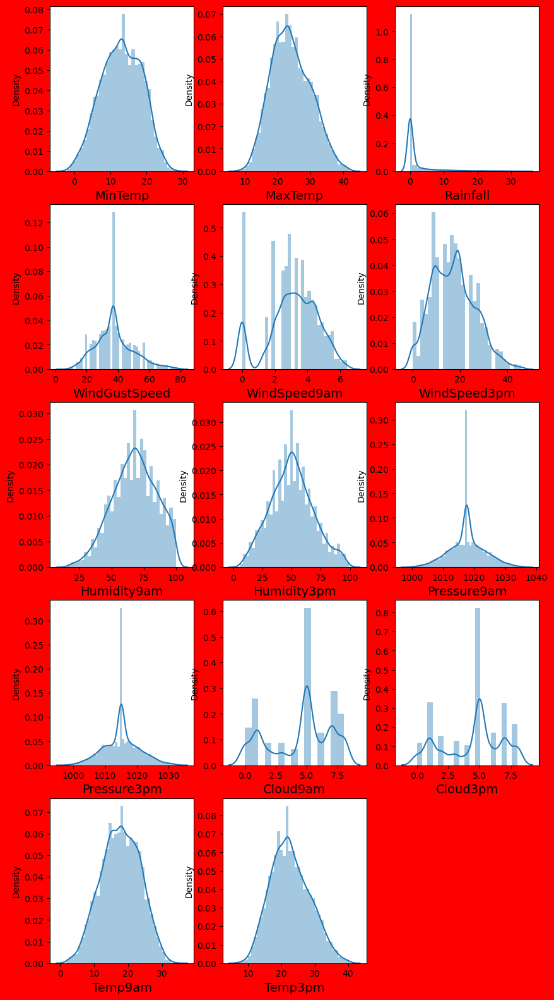

<Figure size 640x480 with 0 Axes>

In [89]:
#Data distribution for all numerical columns
plt.figure(figsize=(10,40),facecolor="r")
p=1
for i in new_df.columns:
    if p<30:
        
        if new_df[i].dtypes=="object":
            continue
            
        plt.subplot(10,3,p)
        sns.distplot(x=new_df[i])
        plt.xlabel(i,fontsize=14)
        
    p+=1
    
plt.show()
plt.tight_layout()

**Observation:-**
    
*Here you can see most of the columns are look like normal distribution but Rainfall columns has skewed distribution because this column skewness is out off range of our acceptable range.*

# Encoding Categorical Columns

In [90]:
from sklearn.preprocessing import OrdinalEncoder

OE=OrdinalEncoder()

for col in new_df.columns:
    if new_df[col].dtypes=="object":
        new_df[col]=OE.fit_transform(new_df[col].values.reshape(-1,1))
        
new_df

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,13.0,44.0,13.0,14.0,4.472136,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0
1,7.4,25.1,0.0,14.0,44.0,6.0,15.0,2.000000,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0
2,12.9,25.7,0.0,15.0,46.0,13.0,15.0,4.358899,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0
3,9.2,28.0,0.0,4.0,24.0,9.0,0.0,3.316625,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0
4,17.5,32.3,1.0,13.0,41.0,1.0,7.0,2.645751,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.4,0.0,0.0,31.0,9.0,1.0,3.605551,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0
8421,3.6,25.3,0.0,6.0,22.0,9.0,3.0,3.605551,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0
8422,5.4,26.9,0.0,3.0,37.0,9.0,14.0,3.000000,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0
8423,7.8,27.0,0.0,9.0,28.0,10.0,3.0,3.605551,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0


**Here you can see all object type columns are encoded.**

# Correlation between Target column and Independent columns

In [91]:
new_df.corr()

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
MinTemp,1.000000,0.729744,0.094634,-0.141190,0.245844,-0.021558,-0.143644,0.196691,0.196619,-0.149826,0.077400,-0.448525,-0.448645,0.071491,0.019184,0.892718,0.698982,0.077923,0.102996
MaxTemp,0.729744,1.000000,-0.138948,-0.200577,0.173624,-0.192305,-0.166223,0.080005,0.125763,-0.416032,-0.419165,-0.350112,-0.427989,-0.245494,-0.245435,0.865591,0.975226,-0.219023,-0.154622
Rainfall,0.094634,-0.138948,1.000000,0.070061,0.092477,0.120431,0.073082,0.030006,0.028847,0.302056,0.296979,-0.113553,-0.055043,0.222574,0.180107,-0.032180,-0.147702,0.674065,0.265478
WindGustDir,-0.141190,-0.200577,0.070061,1.000000,0.025458,0.381152,0.455959,0.149145,0.151945,0.007213,0.017056,-0.087781,-0.008977,0.130529,0.090465,-0.157048,-0.210799,0.111228,0.039034
WindGustSpeed,0.245844,0.173624,0.092477,0.025458,1.000000,-0.060900,0.089826,0.511897,0.623980,-0.279493,-0.109170,-0.364157,-0.328527,-0.011410,0.019741,0.227399,0.141884,0.092265,0.173556
WindDir9am,-0.021558,-0.192305,0.120431,0.381152,-0.060900,1.000000,0.207063,0.180357,0.057416,0.000527,0.121136,-0.022090,0.057995,0.072510,0.053549,-0.067562,-0.200907,0.152115,0.039004
WindDir3pm,-0.143644,-0.166223,0.073082,0.455959,0.089826,0.207063,1.000000,0.025934,0.096758,-0.006198,-0.013193,-0.132813,-0.042825,0.075298,0.053301,-0.151128,-0.178076,0.097532,0.004392
WindSpeed9am,0.196691,0.080005,0.030006,0.149145,0.511897,0.180357,0.025934,1.000000,0.530020,-0.395521,-0.120111,-0.151281,-0.120868,-0.055223,-0.026559,0.192478,0.065739,0.042713,0.048610
WindSpeed3pm,0.196619,0.125763,0.028847,0.151945,0.623980,0.057416,0.096758,0.530020,1.000000,-0.258924,-0.095655,-0.227841,-0.182230,-0.029769,-0.044100,0.219677,0.103591,0.035101,0.035555
Humidity9am,-0.149826,-0.416032,0.302056,0.007213,-0.279493,0.000527,-0.006198,-0.395521,-0.258924,1.000000,0.633130,0.130490,0.167438,0.409574,0.318182,-0.400232,-0.411099,0.373264,0.286620


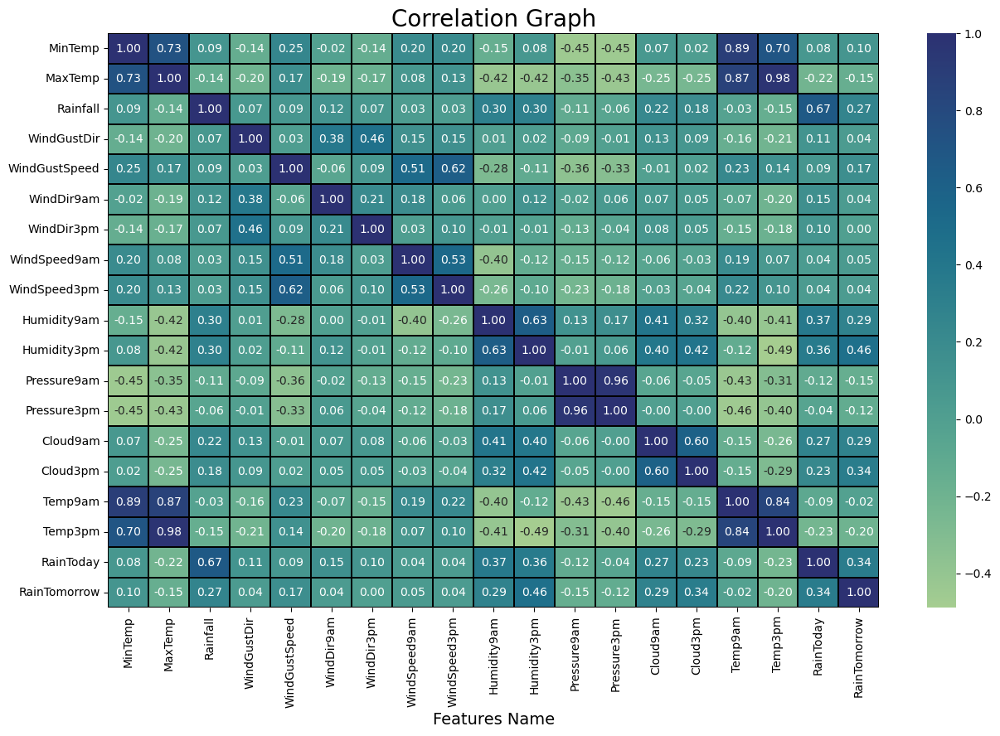

In [92]:
#Visualizing Correlation between Target variable and Independent variables using heatmap
plt.figure(figsize=(15,9))
sns.heatmap(new_df.corr(),cmap="crest",fmt="0.2f",linewidth="0.2",linecolor="black",annot=True)
plt.xlabel("Features Name",fontsize=14)
plt.title("Correlation Graph",fontsize=20)
plt.show()

**Observation:-**
    
*1) Here you can see MinTemp,Temp9am and Temp3pm has very strong positive correlation with MaxTemp.*

*2) MinTemp has also a very strong positive correlation with Temp9am,Temp3pm and MaxTemp.*

*3) Here you can see our Target column RainTomorrow has nither positive nor negative corretation with each column.*

In [94]:
#Checking all column correlation with our target column RainTomorrow
new_df.corr()["RainTomorrow"].sort_values(ascending=True)

Temp3pm         -0.198491
MaxTemp         -0.154622
Pressure9am     -0.151282
Pressure3pm     -0.124205
Temp9am         -0.023091
WindDir3pm       0.004392
WindSpeed3pm     0.035555
WindDir9am       0.039004
WindGustDir      0.039034
WindSpeed9am     0.048610
MinTemp          0.102996
WindGustSpeed    0.173556
Rainfall         0.265478
Cloud9am         0.286206
Humidity9am      0.286620
Cloud3pm         0.340336
RainToday        0.344438
Humidity3pm      0.464495
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

**Ovservation:-**
    
*Here you can see Humidity3pm column is most positively correlated with our Target column RainTomorrow.*

*Temp3pm column is most negative correlated with our Target column.*

# Separating Target column and Features

In [95]:
#Separating Target and Independent variable
x=new_df.iloc[:,:-1]
y=new_df.iloc[:,-1]

print("Features Dimension",x.shape)
print("Label dimension",y.shape)

Features Dimension (6458, 18)
Label dimension (6458,)


In [96]:
x.sample(3)

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
2304,6.4,23.5,0.0,0.0,37.0,3.0,9.0,0.000000,17.0,54.0,50.0,1017.6,1015.1,7.0,5.0,10.8,22.1,0.0
2645,16.4,21.1,1.0,10.0,30.0,12.0,10.0,3.316625,15.0,72.0,60.0,1017.6,1015.1,5.0,5.0,18.3,20.9,0.0
8064,10.3,25.6,0.0,0.0,59.0,1.0,10.0,5.744563,15.0,48.0,23.0,1022.7,1019.4,0.0,0.0,16.8,25.4,0.0


In [97]:
y.sample(3)

2098    1.0
32      0.0
6981    0.0
Name: RainTomorrow, dtype: float64

# Feature scalling using StandardScaler

In [98]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x=pd.DataFrame(ss.fit_transform(x),columns=x.columns)
x

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0.065513,-0.194624,-0.260744,1.220567,0.502187,1.313621,1.372737,0.868576,0.755011,0.202612,-1.558229,-1.752526,-1.431227,1.411865,0.226319,-0.167427,-0.152909,-0.556006
1,-1.017424,0.170021,-0.387091,1.411429,0.502187,-0.225172,1.595709,-0.734497,0.534229,-1.394235,-1.393213,-1.246478,-1.307913,0.207503,0.226319,-0.114684,0.272490,-0.556006
2,-0.024731,0.269469,-0.387091,1.602291,0.665491,1.313621,1.595709,0.795147,0.975793,-1.749089,-1.118187,-1.769976,-1.149368,0.207503,-1.055382,0.553389,0.085314,-0.556006
3,-0.692543,0.650688,-0.387091,-0.497193,-1.130847,0.434311,-1.748868,0.119277,-0.900854,-1.335092,-1.888261,-0.024983,-0.427104,0.207503,0.226319,0.043544,0.646841,-0.556006
4,0.805521,1.363401,-0.176513,1.220567,0.257232,-1.324309,-0.188066,-0.315755,0.313447,0.853179,-0.953172,-1.211578,-1.625005,1.010411,1.508019,-0.009199,1.191353,-0.556006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6453,-1.847676,-0.111750,-0.387091,-1.260642,-0.559285,0.434311,-1.525896,0.306634,-0.680072,-0.980237,-1.448219,1.196512,0.894110,0.207503,0.226319,-1.362925,-0.050813,-0.556006
6454,-1.703285,0.203170,-0.387091,-0.115469,-1.294151,0.434311,-1.079953,0.306634,-0.900854,-0.684525,-1.613234,1.004563,0.682716,0.207503,0.226319,-1.222278,0.306522,-0.556006
6455,-1.378403,0.468366,-0.387091,-0.688056,-0.069375,0.434311,1.372737,-0.086040,-0.900854,-0.861952,-1.448219,0.568314,0.277544,0.207503,0.226319,-0.940984,0.578778,-0.556006
6456,-0.945228,0.484941,-0.387091,0.457118,-0.804240,0.654138,-1.079953,0.306634,-1.121637,-0.980237,-1.448219,0.289115,0.224695,-0.595405,-1.055382,-0.483882,0.561762,-0.556006


# Checking Multi-Colinearity

In [99]:
#Finding VIF for each column
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,8.645093,MinTemp
1,26.509236,MaxTemp
2,1.870115,Rainfall
3,1.523838,WindGustDir
4,2.147709,WindGustSpeed
5,1.341027,WindDir9am
6,1.403072,WindDir3pm
7,1.898465,WindSpeed9am
8,1.944011,WindSpeed3pm
9,3.949227,Humidity9am


**Observation:-**
    
*1) Our acceptable VIF values range is below 10.*

*2) Here you can see MaxTemp,Pressure9am,Pressure3pm,Temp9am and Temp3pm all these column is out of our acceptable VIF value range so I have to delete that column which has highest VIF value between these column.*

*3) Here you can see Temp3pm has the highest VIF value so I have to delete this column.*

In [100]:
#Deleting Temp3pm column because it has highest vif value range
x.drop("Temp3pm",axis=1,inplace=True)

In [102]:
x.sample(3)

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
4374,-0.133025,-0.542693,0.960608,0.647980,-0.069375,1.093794,0.480850,-0.734497,-0.459290,0.853179,0.146933,2.330757,2.180092,0.207503,-0.200915,-0.448720,1.798542
2166,-0.042780,-0.559268,-0.387091,-1.260642,-0.069375,-0.884654,0.257878,-2.031411,-0.017726,0.675752,-0.018082,-0.024983,-0.021932,1.010411,0.226319,-0.360816,-0.556006
3152,1.401136,0.319193,0.960608,0.838842,1.318704,0.873966,0.480850,0.868576,0.975793,-0.033958,0.421960,-1.351178,-0.603266,1.411865,0.226319,0.799521,1.798542


**Now you can see I delete Temp3pm column from my x variable.So now I will check the VIF value again.**

In [103]:
#Checking VIF for each column again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,8.570585,MinTemp
1,9.399877,MaxTemp
2,1.869114,Rainfall
3,1.520996,WindGustDir
4,2.139505,WindGustSpeed
5,1.339357,WindDir9am
6,1.402200,WindDir3pm
7,1.897952,WindSpeed9am
8,1.938895,WindSpeed3pm
9,3.494101,Humidity9am


**Still some of the column has higher VIF than our acceptable range.Now I will delete Pressure9am column because it has highest VIF value and after that I will check the VIF values again.**

In [104]:
#Deleting Pressure9am column because it has highest vif value range
x.drop("Pressure9am",axis=1,inplace=True)

In [105]:
x.sample(3)

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
4339,-0.367662,-0.310647,-0.387091,1.602291,-1.130847,1.753276,1.149765,-0.315755,-1.121637,-0.743667,-0.403119,-0.532801,-1.398313,-1.055382,-0.255331,-0.556006
4684,0.065513,0.518090,-0.387091,1.220567,-2.029016,1.093794,-0.188066,-1.114355,-1.232028,0.912322,-0.678145,-0.110013,-1.799767,-1.482615,-0.044360,-0.556006
5679,0.444542,1.114780,-0.387091,1.029704,2.053570,-1.544137,0.034906,1.804912,1.969313,-0.861952,-1.063182,-1.272681,1.010411,-1.055382,0.553389,-0.556006


**Now you can see I deleted Pressure9am column from my x variable.So now I will check the VIF value again.**

In [106]:
#Checking VIF for each column again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,8.431341,MinTemp
1,9.056450,MaxTemp
2,1.867826,Rainfall
3,1.509366,WindGustDir
4,2.116807,WindGustSpeed
5,1.316610,WindDir9am
6,1.325926,WindDir3pm
7,1.890185,WindSpeed9am
8,1.928892,WindSpeed3pm
9,3.494098,Humidity9am


**Observation:-**
    
*1) Now you can see all columns VIF values are in our acceptable range except Temp9am column but I will delete this column also.Lets see*

In [107]:
#Deleting Temp9am column because it has highest vif value range
x.drop("Temp9am",axis=1,inplace=True)

In [108]:
x.sample(3)

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday
637,-1.342305,-0.725015,-0.387091,0.075393,-0.804240,0.214483,-0.411037,-0.315755,-0.017726,0.971464,0.091928,-0.021932,0.207503,-1.482615,-0.556006
4389,0.029416,-0.708440,-0.387091,0.457118,-0.967544,1.093794,0.257878,-0.734497,-0.459290,-0.566240,0.421960,2.074395,1.010411,1.080786,1.798542
4929,0.029416,-0.857613,-0.387091,1.029704,0.420535,1.093794,1.595709,1.145366,-0.459290,-0.093100,-0.513130,0.894110,0.207503,0.226319,-0.556006


**Now you can see I deleted Temp9am column from my x variable.So now I will check the VIF value again.**

In [109]:
#Checking VIF for each column again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,4.513978,MinTemp
1,5.337283,MaxTemp
2,1.865495,Rainfall
3,1.508348,WindGustDir
4,2.076069,WindGustSpeed
5,1.315458,WindDir9am
6,1.325831,WindDir3pm
7,1.875846,WindSpeed9am
8,1.873874,WindSpeed3pm
9,2.457911,Humidity9am


**Now we can see all columns are in our acceptable VIF value range.**

# Over Sampling

In [110]:
y.value_counts()

0.0    4931
1.0    1527
Name: RainTomorrow, dtype: int64

**Here you can see our Target variable y has class imbalance issue and we have to remove that using SMOTE.**

In [111]:
!pip install imblearn
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x1,y1=SM.fit_resample(x,y)

In [112]:
y1.value_counts()

0.0    4931
1.0    4931
Name: RainTomorrow, dtype: int64

**Now you can see our Target variable y1 has no class imbalance issue.**

# Modeling

# Finding the best Random State

In [113]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
MaxAcc=0
MaxRs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    RFC=RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred=RFC.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>MaxAcc:
        MaxAcc=acc
        MaxRs=i
        
print("The best accuracy score is",MaxAcc,"at Random State",MaxRs)

The best accuracy score is 0.9094288611017236 at Random State 146


# Creating train_test_split

In [114]:
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=MaxRs)

# Classification Algorithms

In [115]:
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier,BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix, roc_curve

**RandomForestClassifier**

In [116]:
#Checking accuracy for RandomForestClassifier
RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
pred_RFC=RFC.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_RFC))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_RFC))
print("Classification Report:-\n",classification_report(y_test,pred_RFC))

Accuracy Score:- 0.9128083812098682
Confution Matrix:-
 [[1335  137]
 [ 121 1366]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.92      0.91      0.91      1472
         1.0       0.91      0.92      0.91      1487

    accuracy                           0.91      2959
   macro avg       0.91      0.91      0.91      2959
weighted avg       0.91      0.91      0.91      2959



**ExtraTreesClassifier**

In [117]:
#Checking accuracy for ExtraTreesClassifier
ETC=ExtraTreesClassifier()
ETC.fit(x_train,y_train)
pred_ETC=ETC.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_ETC))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_ETC))
print("Classification Report:-\n",classification_report(y_test,pred_ETC))

Accuracy Score:- 0.9246367015883744
Confution Matrix:-
 [[1342  130]
 [  93 1394]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.94      0.91      0.92      1472
         1.0       0.91      0.94      0.93      1487

    accuracy                           0.92      2959
   macro avg       0.92      0.92      0.92      2959
weighted avg       0.92      0.92      0.92      2959



**AdaBoostClassifier**

In [118]:
#Checking accuracy for AdaBoostClassifier
ABC=AdaBoostClassifier()
ABC.fit(x_train,y_train)
pred_ABC=ABC.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_ABC))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_ABC))
print("Classification Report:-\n",classification_report(y_test,pred_ABC))

Accuracy Score:- 0.8300101385603245
Confution Matrix:-
 [[1237  235]
 [ 268 1219]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.82      0.84      0.83      1472
         1.0       0.84      0.82      0.83      1487

    accuracy                           0.83      2959
   macro avg       0.83      0.83      0.83      2959
weighted avg       0.83      0.83      0.83      2959



**GradientBoostingClassifier**

In [119]:
#Checking accuracy for GradientBoostingClassifier
GBC=GradientBoostingClassifier()
GBC.fit(x_train,y_train)
pred_GBC=GBC.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_GBC))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_GBC))
print("Classification Report:-\n",classification_report(y_test,pred_GBC))

Accuracy Score:- 0.8688746198039878
Confution Matrix:-
 [[1302  170]
 [ 218 1269]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.86      0.88      0.87      1472
         1.0       0.88      0.85      0.87      1487

    accuracy                           0.87      2959
   macro avg       0.87      0.87      0.87      2959
weighted avg       0.87      0.87      0.87      2959



**BaggingClassifier**

In [120]:
#Checking accuracy for BaggingClassifier
BC=BaggingClassifier()
BC.fit(x_train,y_train)
pred_BC=BC.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_BC))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_BC))
print("Classification Report:-\n",classification_report(y_test,pred_BC))

Accuracy Score:- 0.8823927002365665
Confution Matrix:-
 [[1324  148]
 [ 200 1287]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.87      0.90      0.88      1472
         1.0       0.90      0.87      0.88      1487

    accuracy                           0.88      2959
   macro avg       0.88      0.88      0.88      2959
weighted avg       0.88      0.88      0.88      2959



**DecisionTreeClassifier**

In [121]:
#Checking accuracy for DecisionTreeClassifier
DTC=DecisionTreeClassifier()
DTC.fit(x_train,y_train)
pred_DTC=DTC.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_DTC))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_DTC))
print("Classification Report:-\n",classification_report(y_test,pred_DTC))

Accuracy Score:- 0.8191956742142615
Confution Matrix:-
 [[1198  274]
 [ 261 1226]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.82      0.81      0.82      1472
         1.0       0.82      0.82      0.82      1487

    accuracy                           0.82      2959
   macro avg       0.82      0.82      0.82      2959
weighted avg       0.82      0.82      0.82      2959



**KNeighborsClassifier**

In [122]:
#Checking accuracy for KNeighborsClassifier
KNN=KNeighborsClassifier()
KNN.fit(x_train,y_train)
pred_KNN=KNN.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_KNN))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_KNN))
print("Classification Report:-\n",classification_report(y_test,pred_KNN))

Accuracy Score:- 0.8313619466035823
Confution Matrix:-
 [[1099  373]
 [ 126 1361]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.90      0.75      0.81      1472
         1.0       0.78      0.92      0.85      1487

    accuracy                           0.83      2959
   macro avg       0.84      0.83      0.83      2959
weighted avg       0.84      0.83      0.83      2959



**SVC**

In [123]:
#Checking accuracy for SVC
svc=SVC()
svc.fit(x_train,y_train)
pred_svc=svc.predict(x_test)
print("Accuracy Score:-",accuracy_score(y_test,pred_svc))
print("Confution Matrix:-\n",confusion_matrix(y_test,pred_svc))
print("Classification Report:-\n",classification_report(y_test,pred_svc))

Accuracy Score:- 0.8330517066576546
Confution Matrix:-
 [[1233  239]
 [ 255 1232]]
Classification Report:-
               precision    recall  f1-score   support

         0.0       0.83      0.84      0.83      1472
         1.0       0.84      0.83      0.83      1487

    accuracy                           0.83      2959
   macro avg       0.83      0.83      0.83      2959
weighted avg       0.83      0.83      0.83      2959



**MultinomialNB**

In [124]:
#Checking accuracy for MultinomialNB
try:
    MNB=MultinomialNB()
    MNB.fit(x_train,y_train)
    pred_MNB=MNB.predict(x_test)
    print("Accuracy Score:-",accuracy_score(y_test,pred_MNB))
    print("Confution Matrix:-\n",confusion_matrix(y_test,pred_MNB))
    print("Classification Report:-\n",classification_report(y_test,pred_MNB))
except ValueError:
    print("Negative values in data passed to MultinomialNB")

Negative values in data passed to MultinomialNB


**Observation:-**
    
*1) Bases on the accuracy and other matrics ExtraTreesClassifier is the best model till now but we all know that this is not actual accuracy we have to Cross check it with cross validation.*

# Cross validation

In [125]:
from sklearn.model_selection import cross_val_score

**Cross validation of RandomForestClassifier**

In [126]:
score=cross_val_score(RFC,x1,y1)
print(score)
print(score.mean())
print("Difference between accuracy score of RandomForestClassifier and cross validation score is:-",(accuracy_score(y_test,pred_RFC)-score.mean())*100)

[0.83020781 0.64977192 0.82809331 0.90111562 0.92494929]
0.8268275882630522
Difference between accuracy score of RandomForestClassifier and cross validation score is:- 8.598079294681593


**Cross validation of ExtraTreeClassifier**

In [127]:
score1=cross_val_score(ETC,x1,y1)
print(score1)
print(score1.mean())
print("Difference between accuracy score of ExtraTreeClassifier and cross validation score is:-",(accuracy_score(y_test,pred_ETC)-score1.mean())*100)

[0.87379625 0.72022301 0.84584178 0.9137931  0.93864097]
0.8584590244158206
Difference between accuracy score of ExtraTreeClassifier and cross validation score is:- 6.617767717255385


**Cross validation of AdaBoostClassifier**

In [128]:
score2=cross_val_score(ABC,x1,y1)
print(score2)
print(score2.mean())
print("Difference between accuracy score of AdaBoostClassifier and cross validation score is:-",(accuracy_score(y_test,pred_ABC)-score2.mean())*100)

[0.73238723 0.58185504 0.75507099 0.84685598 0.85598377]
0.7544306042321851
Difference between accuracy score of AdaBoostClassifier and cross validation score is:- 7.557953432813935


**Cross validation of GradientBoostingClassifier**

In [129]:
score3=cross_val_score(GBC,x1,y1)
print(score3)
print(score3.mean())
print("Difference between accuracy score of GradientBoostingClassifier and cross validation score is:-",(accuracy_score(y_test,pred_GBC)-score3.mean())*100)

[0.7440446  0.61023822 0.78803245 0.89148073 0.89503043]
0.7857652857182511
Difference between accuracy score of GradientBoostingClassifier and cross validation score is:- 8.310933408573673


**Cross validation of BaggingClassifier**

In [130]:
score4=cross_val_score(BC,x1,y1)
print(score4)
print(score4.mean())
print("Difference between accuracy score of BaggingClassifier and cross validation score is:-",(accuracy_score(y_test,pred_BC)-score4.mean())*100)

[0.78256462 0.64014192 0.8296146  0.89503043 0.90517241]
0.8105047964971333
Difference between accuracy score of BaggingClassifier and cross validation score is:- 7.188790373943322


**Cross validation of DecisionTreeClassifier**

In [131]:
score5=cross_val_score(DTC,x1,y1)
print(score5)
print(score5.mean())
print("Difference between accuracy score of DecisionTreeClassifier and cross validation score is:-",(accuracy_score(y_test,pred_DTC)-score5.mean())*100)

[0.72377091 0.60060821 0.78296146 0.84381339 0.85395538]
0.761021868243601
Difference between accuracy score of DecisionTreeClassifier and cross validation score is:- 5.817380597066057


**Cross validation of KNeighborsClassifier**

In [132]:
score6=cross_val_score(KNN,x1,y1)
print(score6)
print(score6.mean())
print("Difference between accuracy score of KNeighborsClassifier and cross validation score is:-",(accuracy_score(y_test,pred_KNN)-score6.mean())*100)

[0.8109478  0.64825139 0.76217039 0.80628803 0.8362069 ]
0.7727729006907655
Difference between accuracy score of KNeighborsClassifier and cross validation score is:- 5.858904591281677


**Cross validation of SVC**

In [133]:
score7=cross_val_score(svc,x1,y1)
print(score7)
print(score7.mean())
print("Difference between accuracy score of SVC and cross validation score is:-",(accuracy_score(y_test,pred_svc)-score7.mean())*100)

[0.79523568 0.63405981 0.73377282 0.81135903 0.8372211 ]
0.7623296860558719
Difference between accuracy score of SVC and cross validation score is:- 7.072202060178268


**Observation:-**

*1) So you can see KNeighborsClassifier,DecisionTreeClassifier and ExtraTreeClassifier have the the least cross validation deffereence.So from these algorithms I will pick DecisionTreeClassifier because it's difference between it's cross_val_score with it accuracy is very less.*

*2) So I took DecisionTreeClassifier as our best model.*

# Hyper Parameter Tuning

In [151]:
#DecisionTreeClassifier 
from sklearn.model_selection import GridSearchCV
paramiters={
    "criterion":["gini", "entropy", "log_loss"],
    "splitter":["best","random"],
    "min_samples_split":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
       "max_depth":list(range(1, 51)),
       "min_samples_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
       "max_features":["sqrt", "log2"],
       "random_state":list(range(1, 51))
    
}

In [152]:
GCV=GridSearchCV(DecisionTreeClassifier(),paramiters,cv=5)

In [153]:
GCV.fit(x_train,y_train)

KeyboardInterrupt: 

# so after 20 hours also GridSearchCV is in still executing stage so I will go for RandomizedSearchCV.Let's see: 

# Hyper Parameter Tuning with RandomizedSearchCV

In [183]:
#DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
paramiters={
    "criterion":["gini", "entropy", "log_loss"],
    "splitter":["best","random"],
    "min_samples_split":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
    "max_depth":list(range(1, 100)),
    "min_samples_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
    "max_features":["sqrt", "log2"],
    "random_state":list(range(1, 100)),
    
}

In [188]:
RSCV=RandomizedSearchCV(DecisionTreeClassifier(),paramiters,cv=5)

In [189]:
RSCV.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                      10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19, 20, 21,
                                                      22, 23, 24, 25, 26, 27,
                                                      28, 29, 30, ...],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [0.1, 0.2, 0.3, 0.4,
                                                             0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1.0],
                                        'min_samples_split': [0.1, 0.2, 0.3,
                                                              0.4, 0.5, 0.6,
                                                              0.7, 0.8, 0.9,
                                                              1.0],
                                        'random_state': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10, 11, 12, 13, 14,
                                                         15, 16, 17, 18, 19, 20,
                                                         21, 22, 23, 24, 25, 26,
                                                         27, 28, 29, 30, ...],
                                        'splitter': ['best', 'random']})

In [190]:
#Checking best parameters values
RSCV.best_params_

{'splitter': 'best',
 'random_state': 31,
 'min_samples_split': 0.8,
 'min_samples_leaf': 0.4,
 'max_features': 'log2',
 'max_depth': 62,
 'criterion': 'gini'}

# Final Model

In [262]:
Final_Model=DecisionTreeClassifier(criterion='gini',max_depth=62,max_features='log2',min_samples_leaf=0.4,min_samples_split=0.8,random_state=31,splitter='best')
Final_Model.fit(x_train,y_train)
pred=Final_Model.predict(x_test)
acc=accuracy_score(y_test,pred)
print("Accuracy:-",acc*100)

Accuracy:- 71.67962149374789


**Here you can see after crossvalidation my DecisionTreeClassifier accuracy score was 76.10 and now it is 71.67 so you can see it clearly decrease so to increase I have to change some perameter's value or I can add some more parameter.Here I will try to change some parameter's value and try to increase the accuracy.Let's see:** 

In [263]:
Final_Model=DecisionTreeClassifier(criterion='gini',max_depth=62,max_features='log2',min_samples_leaf=0.1,min_samples_split=0.1,random_state=42,splitter='best')
Final_Model.fit(x_train,y_train)
pred=Final_Model.predict(x_test)
acc=accuracy_score(y_test,pred)
print("Accuracy:-",acc*100)

Accuracy:- 76.44474484623184


**Observation:-**
    
*1) So here you can see I changed some of the parameter's value and my model's accuracy is increased.*

*2) Earlier my DecisionTreeClassifier accuracy score was 76.10 and now it is 76.44 so you can see it clearly increased.*

# Plotting ROC and compare AUC for Final Model

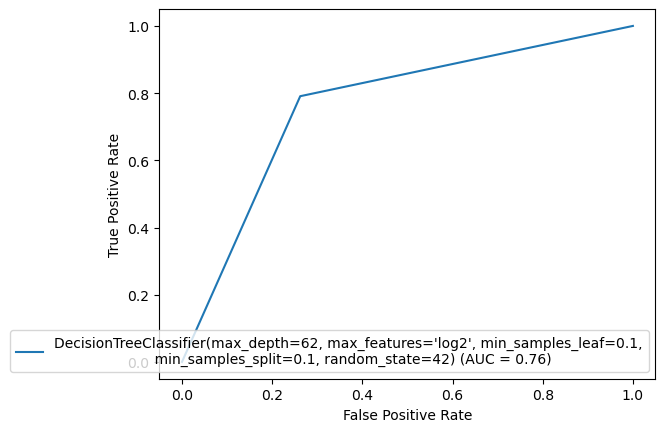

In [264]:
from sklearn import metrics
fpr,tpr,thresholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=Final_Model)
display.plot()

**Here we have ploted the ROC Curve for the Final Model and the AUC value for the best model is 76% that means it can clearly predict the wether tomorrow will be raining or not.**

# Saving the best model

**Serialization**

In [265]:
#Saving best model
import joblib
joblib.dump(Final_Model,"Rain_predict.pkl")

['Rain_predict.pkl']

**De-Serialization**

In [266]:
#Loading the model and try to make prediction with it.
Model=joblib.load("Rain_predict.pkl")

prediction=Model.predict(x_test)
prediction

array([0., 1., 1., ..., 1., 1., 1.])

In [267]:
#Comparing orginal data with predicted one
Check=np.array(y_test)
Data=pd.DataFrame()
Data["Prediction"]=prediction
Data["Original"]=Check
Data

,Prediction,Original
0,0.0,0.0
1,1.0,1.0
2,1.0,0.0
3,0.0,1.0
4,1.0,0.0
...,...,...
2954,1.0,1.0
2955,0.0,0.0
2956,1.0,1.0
2957,1.0,1.0


**Here you can see my model predict quiet accurately.**

# User Define Function to predict whether or not it will rain tomorrow

In [268]:
def Tomorrow_rain_prediction(a):
    a=a.reshape(1,-1)
    result=Model.predict(a)
    if result==1:
        print("Oh no! Tomorrow will be a rainy day.")
        
    else:
        print("woo hoo! There will be no rain tomorrow.")

In [269]:
user=np.array([-1.342305,-0.725015,-0.387091,0.075393,-0.804240,0.214483,-0.411037,-0.315755,-0.017726,0.971464,0.091928,-0.021932,0.207503,-1.482615,-0.556006])

In [270]:
Tomorrow_rain_prediction(user)

woo hoo! There will be no rain tomorrow.


**So you can see my user define function is also working.**

# So here you can see I built the model that can predict whether or not it will rain tomorrow on the basis of the details provided in the dataset. Thank you.

# Now I am going to predict how much rainfall could be there

**So for that I already complete the EDA part and Visualization for my dataset earlier so I am going to skip these two parts:**

# EDA

**EDA is already done.So I will skip this part.**

# Visualization

**I completed all visualization for Rainfall with other columns in earlier part. Here I create some more visualization.**

<Figure size 1200x600 with 0 Axes>

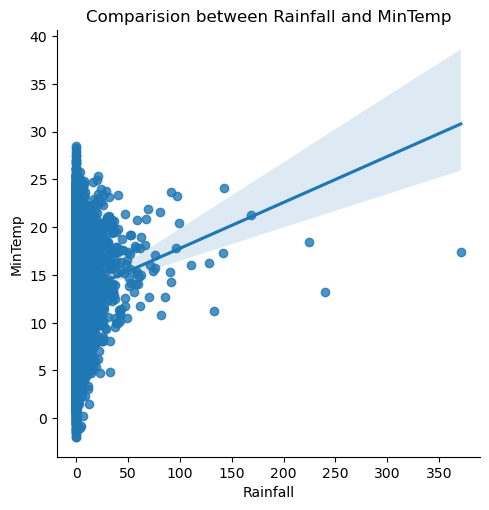

In [272]:
#Analysis between our Target column Rainfall and MinTemp
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='MinTemp', data=df)
plt.title('Comparision between Rainfall and MinTemp')
plt.xlabel('Rainfall')
plt.ylabel('MinTemp')
plt.show()

**Here you can see if the MinTemp increases the rainfall also increases.**

<Figure size 1200x600 with 0 Axes>

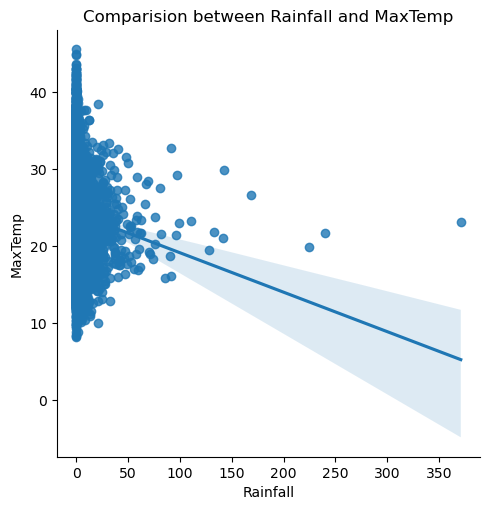

In [273]:
#Analysis between our Target column Rainfall and MaxTemp
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='MaxTemp', data=df)
plt.title('Comparision between Rainfall and MaxTemp')
plt.xlabel('Rainfall')
plt.ylabel('MaxTemp')
plt.show()

**Here you can see if the MaxTemp decreases the Rainfall is increases.**

<Figure size 1200x600 with 0 Axes>

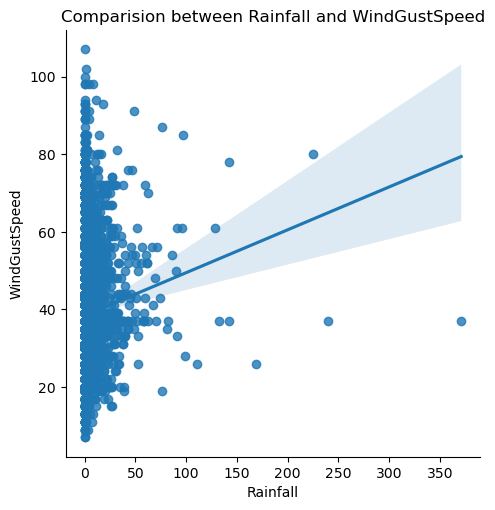

In [274]:
#Analysis between our Target column Rainfall and WindGustSpeed
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='WindGustSpeed', data=df)
plt.title('Comparision between Rainfall and WindGustSpeed')
plt.xlabel('Rainfall')
plt.ylabel('WindGustSpeed')
plt.show()

**Here we can not give any conclusion about WindGustSpeed and Rainfall column.**

<Figure size 1200x600 with 0 Axes>

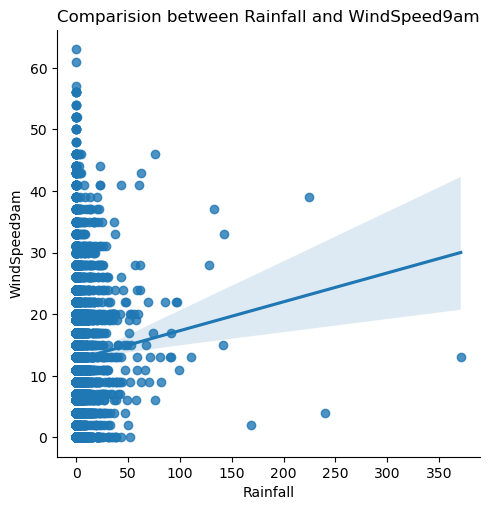

In [275]:
#Analysis between our Target column Rainfall and WindSpeed9am
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='WindSpeed9am', data=df)
plt.title('Comparision between Rainfall and WindSpeed9am')
plt.xlabel('Rainfall')
plt.ylabel('WindSpeed9am')
plt.show()

**Here you can see my WindSpeed9am column has no correlation with Rainfall.**

<Figure size 1200x600 with 0 Axes>

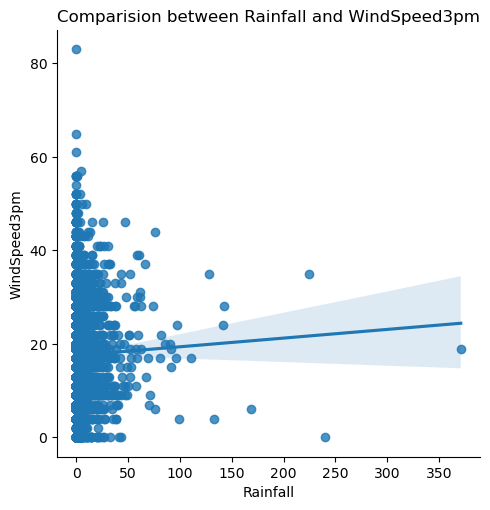

In [276]:
#Analysis between our Target column Rainfall and WindSpeed3pm
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='WindSpeed3pm', data=df)
plt.title('Comparision between Rainfall and WindSpeed3pm')
plt.xlabel('Rainfall')
plt.ylabel('WindSpeed3pm')
plt.show()

**There is not a strong correlation with WindSpeed3pm and Rainfall column.**

<Figure size 1200x600 with 0 Axes>

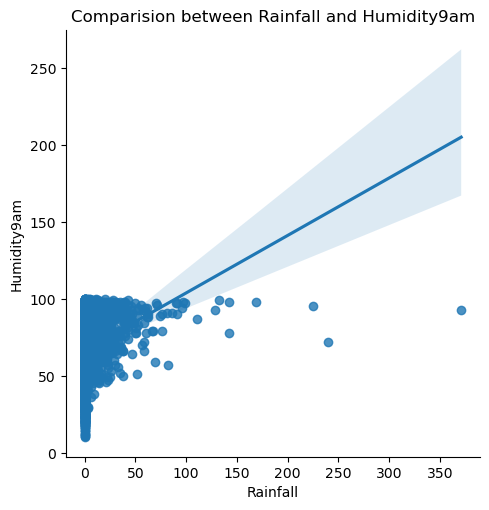

In [277]:
#Analysis between our Target column Rainfall and Humidity9am
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='Humidity9am', data=df)
plt.title('Comparision between Rainfall and Humidity9am')
plt.xlabel('Rainfall')
plt.ylabel('Humidity9am')
plt.show()

**Here you can see Humidity9am and Rainfall has a good positive correlation.**

<Figure size 1200x600 with 0 Axes>

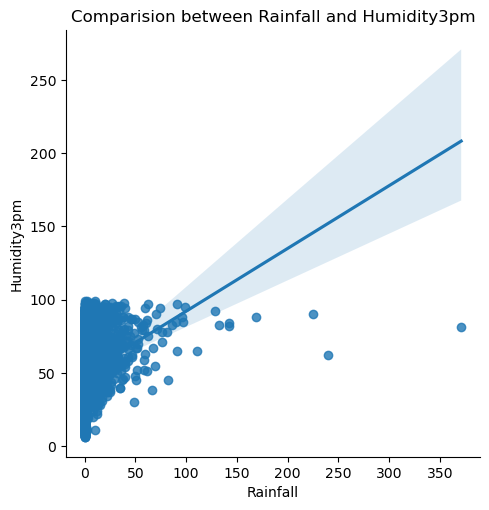

In [278]:
#Analysis between our Target column Rainfall and Humidity3pm
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='Humidity3pm', data=df)
plt.title('Comparision between Rainfall and Humidity3pm')
plt.xlabel('Rainfall')
plt.ylabel('Humidity3pm')
plt.show()

**Like Humidity9am ,Humidity3pm also has a positive correlation with Rainfall.**

<Figure size 1200x600 with 0 Axes>

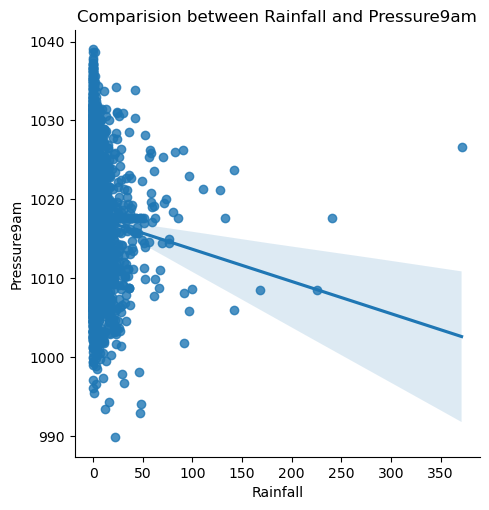

In [279]:
#Analysis between our Target column Rainfall and Pressure9am
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='Pressure9am', data=df)
plt.title('Comparision between Rainfall and Pressure9am')
plt.xlabel('Rainfall')
plt.ylabel('Pressure9am')
plt.show()

**You can see Pressure9am has a negative correlation with Rainfall.**

<Figure size 1200x600 with 0 Axes>

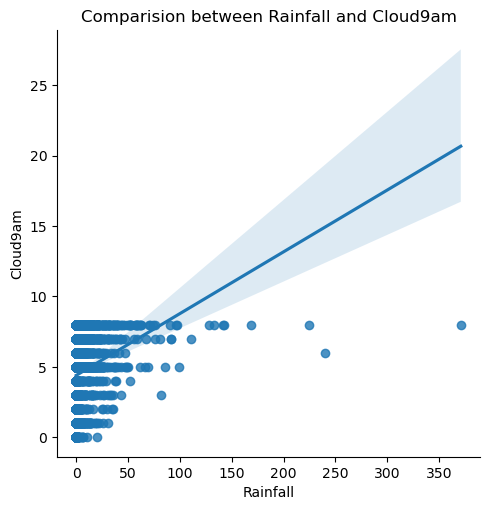

In [280]:
#Analysis between our Target column Rainfall and Cloud9am
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='Cloud9am', data=df)
plt.title('Comparision between Rainfall and Cloud9am')
plt.xlabel('Rainfall')
plt.ylabel('Cloud9am')
plt.show()

**Here you can see if the cloud is increases the the chance of heavy rain is also increases.**

<Figure size 1200x600 with 0 Axes>

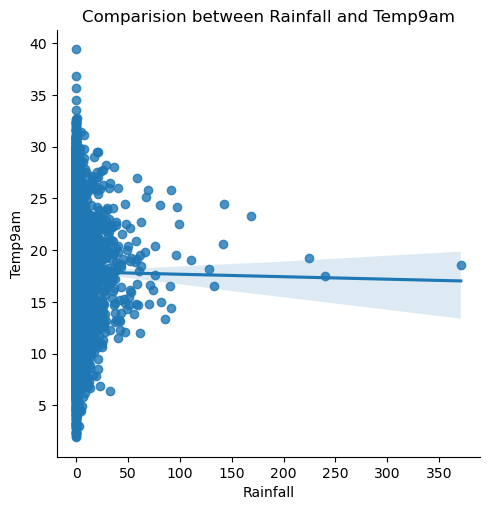

In [281]:
#Analysis between our Target column Rainfall and Temp9am
plt.figure(figsize=(12, 6))
sns.lmplot(x='Rainfall', y='Temp9am', data=df)
plt.title('Comparision between Rainfall and Temp9am')
plt.xlabel('Rainfall')
plt.ylabel('Temp9am')
plt.show()

**Here you can see if the Temp9am lies between 10 to 25 there is a good chance of heavy rain.**

# Deleting Unnecessary Columns

**Here you can see we don't need RainToday and RainTomorrow columns to predict how much rainfall could be there,So I am going to delete it.** 

In [282]:
df.drop(["RainToday","RainTomorrow"],axis=1,inplace=True)

In [283]:
df.sample(2)

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
6670,11.2,22.1,0.0,SE,20.0,SW,S,6.0,4.0,67.0,48.0,1024.4,1021.3,1.0,6.0,15.9,20.3
6537,18.4,28.4,0.0,SE,39.0,SE,ESE,9.0,17.0,61.0,50.0,1020.5,1017.7,5.0,6.0,25.8,27.6


**You can see "RainToday" and "RainTomorrow" column is deleted.**

# Checking for outliers

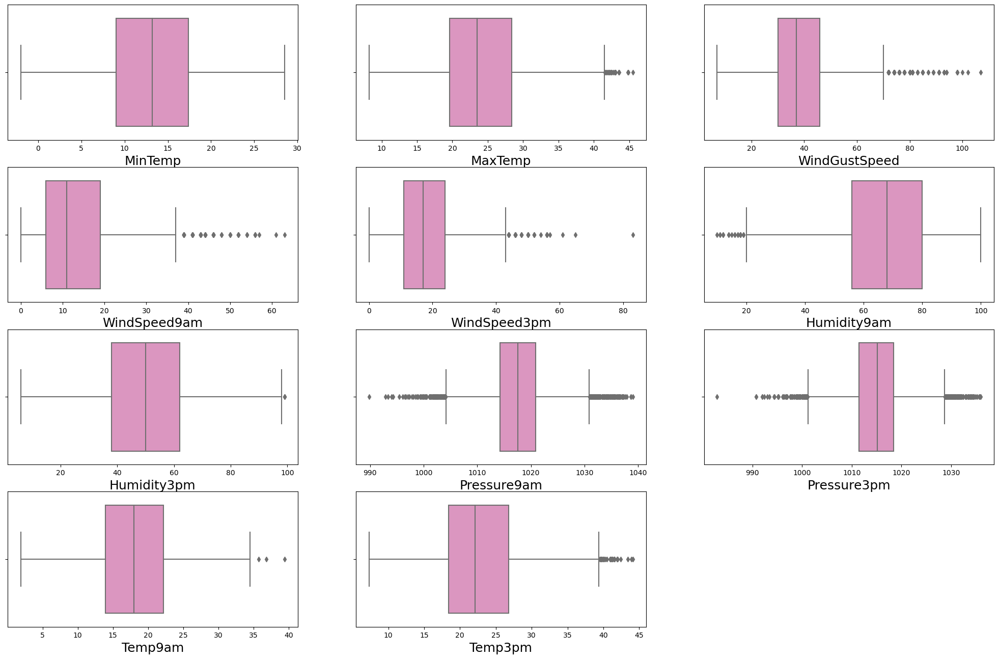

<Figure size 640x480 with 0 Axes>

In [284]:
#Avoiding "Rainfall" column because it's my Target column and avoiding all other categorical columns
#Apart from "WindGustDir","WindDir9am","WindDir3pm","Cloud9am","Cloud3pm" these columns all are other columns are ordinal columns and I have to check outliers from those ordinal columns
out=df[["MinTemp","MaxTemp","WindGustSpeed","WindSpeed9am","WindSpeed3pm","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm","Temp9am","Temp3pm"]]
plt.figure(figsize=(25,20),facecolor="white")
p=1
for i in out:
        if p<=20:
        
            
            plt.subplot(5,3,p)
            sns.boxplot(x=df[i],palette="Set2_r",data=df)
            plt.xlabel(i,fontsize=18)
            plt.yticks(rotation=0,fontsize=18)
            p+=1
plt.show()
plt.tight_layout()

**Here you can see except MinTemp column all columns have the outliers.**

In [271]:
df

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No
1,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No
2,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No
3,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No
4,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.4,0.0,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,No,No
8421,3.6,25.3,0.0,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,No,No
8422,5.4,26.9,0.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,No,No
8423,7.8,27.0,0.0,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# Removing outliers

In [285]:
out=df[["MinTemp","MaxTemp","WindGustSpeed","WindSpeed9am","WindSpeed3pm","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm","Temp9am","Temp3pm"]]
from scipy.stats import zscore

z=np.abs(zscore(out))
z

,MinTemp,MaxTemp,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.052329,0.194668,0.395568,0.739082,0.674191,0.203097,1.538651,1.645999,1.343353,0.174035,0.150755
1,1.030652,0.164227,0.395568,0.895514,0.464727,1.368362,1.376463,1.164869,1.226045,0.121606,0.267878
2,0.037920,0.262108,0.544900,0.636920,0.883655,1.717576,1.106150,1.662590,1.075221,0.542498,0.083680
3,0.705758,0.637317,1.097751,0.180378,0.896789,1.310160,1.863027,0.003521,0.388132,0.035682,0.636275
4,0.792365,1.338795,0.171570,0.589027,0.255263,0.843321,0.943962,1.131688,1.527694,0.016748,1.172125
...,...,...,...,...,...,...,...,...,...,...,...
8420,1.860937,0.113101,0.575089,0.023947,0.687325,0.960947,1.430526,1.157828,0.868739,1.362432,0.050283
8421,1.716540,0.196854,1.247082,0.023947,0.896789,0.669936,1.592714,0.975330,0.667639,1.222621,0.301369
8422,1.391646,0.457869,0.127093,0.384702,0.896789,0.844543,1.430526,0.560563,0.282199,0.942998,0.569294
8423,0.958453,0.474183,0.799087,0.023947,1.106253,0.960947,1.430526,0.295112,0.231924,0.488611,0.552548


In [286]:
#Finding outliets location
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  466,  466,  563,  567,  568,  568,  569,
         602,  602,  603,  683,  683,  748,  748,  795,  928,  980,  980,
        1189, 1535, 1587, 1644, 1665, 1898, 1903, 1945, 2016, 2028, 2043,
        2074, 2186, 2219, 2219, 2230, 2500, 2505, 2527, 2527, 2859, 2900,
        3027, 3051, 3055, 3058, 3059, 3059, 3060, 3066, 3067, 3067, 3067,
        3068, 3070, 3082, 3082, 3082, 3089, 3089, 3099, 3099, 3141, 3153,
        3153, 3157, 3167, 3169, 3172, 3212, 3212, 3212, 3234, 3278, 3278,
        3280, 3291, 3302, 3302, 3303, 3360, 3446, 3449, 3449, 3449, 3450,
        3450, 3450, 3458, 3471, 3491, 3509, 3557, 3602, 3603, 3608, 3609,
        3617, 3618, 3628, 3675, 3675, 3676, 3676, 3676, 3678, 3683, 3701,
        3714, 3716, 3766, 3766, 3773, 3786, 3786, 3805, 3806, 3820, 3825,
        3826, 3826, 3879, 3879, 3923, 

In [287]:
#Checking outliers by giving row and column number
z.iloc[8,2]

3.0835422168793576

**Here you can see by giving row and column location we can see the zscore value is above 3 that means it's an outlier.**

# Creating a outlier free dataset

In [288]:
new_df_2=df[(z<3).all(axis=1)]
new_df_2.shape

(6546, 17)

In [289]:
print("Old DataFrame",df.shape[0])
print("New DataFrame",new_df_2.shape[0])

Old DataFrame 6762
New DataFrame 6546


**Here you can see 216 rows are deleted as they have outliers.**

In [290]:
print("Data lost percentage after appliing zscore:-",((df.shape[0]-new_df_2.shape[0])/df.shape[0])*100)

Data lost percentage after appliing zscore:- 3.1943212067435667


**The datalost percentage after removing outliers is 3% and we can afford it.**

# Checking for skewness

In [302]:
new_df_2.skew().to_frame("Skewness values")

,Skewness values
MinTemp,-0.093420
MaxTemp,0.273881
Rainfall,14.131962
WindGustSpeed,0.547153
WindSpeed9am,-2.192499
WindSpeed3pm,0.343117
Humidity9am,-0.236844
Humidity3pm,0.159767
Pressure9am,0.064985
Pressure3pm,0.091148


**Observation:-**

*1) You can see our acceptable skewness value range is +0.5 to -0.5.But Here apart from "Rainfall"and "WindSpeed9am" all columns are in our acceptable range.But we have to reduce only WindSpeed9am column's skewness because Rainfall is our Target column and we have ignore it's skewness.*

*2) So I have to try to reduce the skewness of "WindSpeed9am" column.*

# Reducing Skewness

In [303]:
#Trying to reduce skewness using square root method

a=new_df_2["WindSpeed9am"]

a=np.sqrt(a)

print("WindSpeed9am skewness:",a.skew())

WindSpeed9am skewness: -2.3974208483208


*Here you can see sqrt can not reduce the WindSpeed9am columns skewness so I will different methods.*

In [304]:
#Trying to reduce skewness using cube root method

a=new_df_2["WindSpeed9am"]

a=np.cbrt(a)

print("WindSpeed9am skewness:",a.skew())

WindSpeed9am skewness: -2.439385386875649


**Not working**

In [305]:
#Trying to reduce skewness using log method

a=new_df_2["WindSpeed9am"]

a=np.log(a)

print("WindSpeed9am skewness:",a.skew())

WindSpeed9am skewness: nan


**Still not working.**

In [306]:
#Trying to reduce skewness using log1p method
a=new_df_2["WindSpeed9am"]

a=np.log1p(a)

print("WindSpeed9am skewness:",a.skew())

WindSpeed9am skewness: -2.3381794937669085


**Not working.**

In [307]:
#using PowerTransformer to reduce the skewness
from sklearn.preprocessing import PowerTransformer

pt=PowerTransformer("yeo-johnson")   #yeo-johnson method works on both positive and Negative method

a=new_df_2["WindSpeed9am"]


#Reshaping the columns because power transformar need 2d array instead 1d
a_reshape=a.values.reshape(-1,1)


#Now fitting the Transformer
a_transform=pt.fit_transform(a_reshape)


#Convert the transformed array back to the DataFrame
a=pd.DataFrame(a_transform)

print("WindSpeed9am skewness:",a.skew())

WindSpeed9am skewness: 0   -0.827454
dtype: float64


**Still not working.**

**Observation:-**
    
*1) I used log transform,log function+1,sqrt,cbrt,PowerTransformar also I can not use boxcox because WindSpeed9am column has negative skewness but nothing happend so I consider that WindSpeed9am column's skewness is threshold for this column and we have to accept it.*

# Encoding categorical columns

In [308]:
from sklearn.preprocessing import OrdinalEncoder

OE=OrdinalEncoder()

for col in new_df_2.columns:
    if new_df_2[col].dtypes=="object":
        new_df_2[col]=OE.fit_transform(new_df_2[col].values.reshape(-1,1))
        
new_df_2

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,13.0,44.0,13.0,14.0,1.454215,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8
1,7.4,25.1,0.0,14.0,44.0,6.0,15.0,1.189207,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3
2,12.9,25.7,0.0,15.0,46.0,13.0,15.0,1.444921,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2
3,9.2,28.0,0.0,4.0,24.0,9.0,0.0,1.349504,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5
4,17.5,32.3,1.0,13.0,41.0,1.0,7.0,1.275373,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.4,0.0,0.0,31.0,9.0,1.0,1.377980,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4
8421,3.6,25.3,0.0,6.0,22.0,9.0,3.0,1.377980,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5
8422,5.4,26.9,0.0,3.0,37.0,9.0,14.0,1.316074,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1
8423,7.8,27.0,0.0,9.0,28.0,10.0,3.0,1.377980,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0


**Here you can see all categorical columns are now encoded.**

# Correlation between Target column and Independent columns

In [309]:
new_df_2.corr()

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
MinTemp,1.000000,0.726355,0.092641,-0.139699,0.245071,-0.019782,-0.145332,0.185616,0.193960,-0.140417,0.085185,-0.447435,-0.446607,0.078626,0.025895,0.891765,0.695490
MaxTemp,0.726355,1.000000,-0.085316,-0.198821,0.169139,-0.192690,-0.167897,0.099879,0.122681,-0.415182,-0.417992,-0.350060,-0.428399,-0.245944,-0.245247,0.864689,0.975169
Rainfall,0.092641,-0.085316,1.000000,0.021770,0.071182,0.087433,0.026864,0.007414,0.013145,0.225695,0.240366,-0.051299,-0.011654,0.183114,0.145864,-0.002548,-0.090133
WindGustDir,-0.139699,-0.198821,0.021770,1.000000,0.027058,0.380372,0.455970,0.194241,0.150359,0.007513,0.016830,-0.089683,-0.010952,0.128551,0.090572,-0.156487,-0.209339
WindGustSpeed,0.245071,0.169139,0.071182,0.027058,1.000000,-0.058378,0.088827,0.304415,0.622818,-0.270168,-0.101525,-0.361069,-0.324635,-0.005898,0.024067,0.224102,0.137323
WindDir9am,-0.019782,-0.192690,0.087433,0.380372,-0.058378,1.000000,0.209447,0.289232,0.056897,0.005300,0.123220,-0.021651,0.058868,0.075518,0.055119,-0.068275,-0.201150
WindDir3pm,-0.145332,-0.167897,0.026864,0.455970,0.088827,0.209447,1.000000,0.004372,0.096024,-0.005983,-0.013952,-0.131969,-0.042070,0.072679,0.051252,-0.153784,-0.179959
WindSpeed9am,0.185616,0.099879,0.007414,0.194241,0.304415,0.289232,0.004372,1.000000,0.392114,-0.337313,-0.100993,-0.116623,-0.102540,-0.061034,-0.035768,0.204774,0.085220
WindSpeed3pm,0.193960,0.122681,0.013145,0.150359,0.622818,0.056897,0.096024,0.392114,1.000000,-0.254816,-0.095078,-0.224712,-0.178335,-0.026716,-0.044511,0.216124,0.100963
Humidity9am,-0.140417,-0.415182,0.225695,0.007513,-0.270168,0.005300,-0.005983,-0.337313,-0.254816,1.000000,0.637724,0.128524,0.166899,0.416671,0.324014,-0.394811,-0.410565


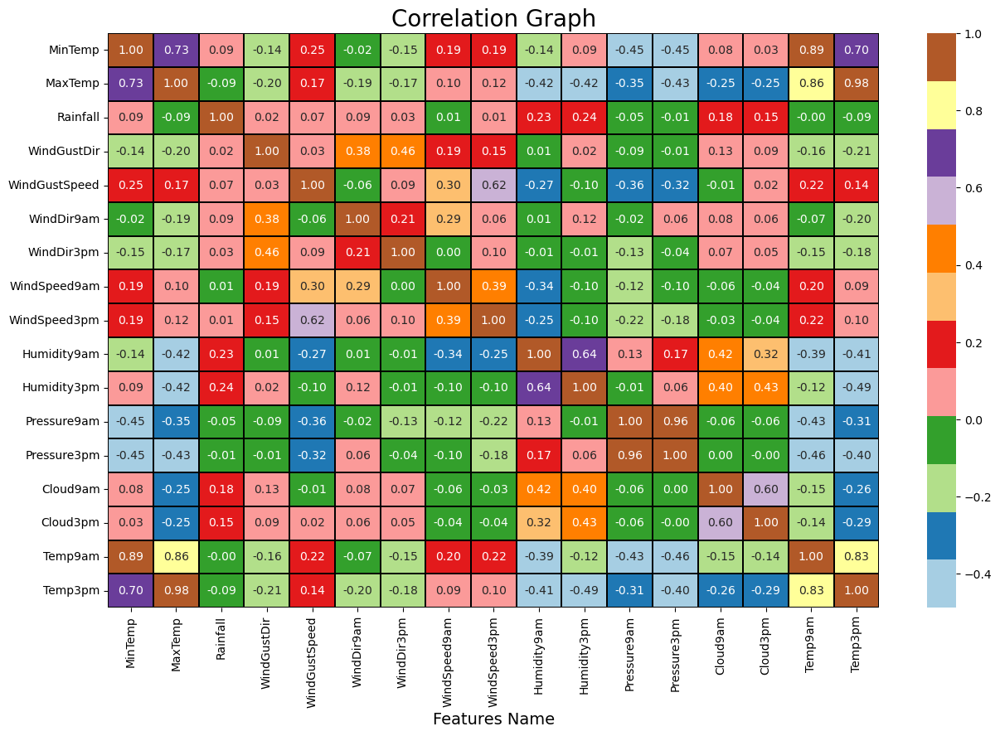

In [311]:
#Visualizing Correlation between Target column and Independent column using heatmap
plt.figure(figsize=(15,9))
sns.heatmap(new_df_2.corr(),cmap="Paired",fmt="0.2f",linewidth="0.2",linecolor="black",annot=True)
plt.xlabel("Features Name",fontsize=14)
plt.title("Correlation Graph",fontsize=20)
plt.show()

**Observation:-**

*1) Here you can see MinTemp,Temp9am and Temp3pm has very strong positive correlation with MaxTemp.*

*2) MinTemp has also a very strong positive correlation with Temp9am,Temp3pm and MaxTemp.*

*3) Here you can see our Target column Rainfall has nither positive nor negative corretation with any column.*

In [313]:
#Checking all column correlation with our target column RainTomorrow
new_df_2.corr()["Rainfall"].sort_values(ascending=True)

Temp3pm         -0.090133
MaxTemp         -0.085316
Pressure9am     -0.051299
Pressure3pm     -0.011654
Temp9am         -0.002548
WindSpeed9am     0.007414
WindSpeed3pm     0.013145
WindGustDir      0.021770
WindDir3pm       0.026864
WindGustSpeed    0.071182
WindDir9am       0.087433
MinTemp          0.092641
Cloud3pm         0.145864
Cloud9am         0.183114
Humidity9am      0.225695
Humidity3pm      0.240366
Rainfall         1.000000
Name: Rainfall, dtype: float64

**Ovservation:-**

*Here you can see Humidity3pm column is most positively correlated with our Target column Rainfall.*

*Temp3pm column is most negative correlated with our Target column Rainfall.*

# Separating Target column and Features

In [317]:
#Separating Target and Independent variable
x=new_df_2.drop("Rainfall",axis=1)
y=new_df_2["Rainfall"]

print("Features Dimension",x.shape)
print("Label dimension",y.shape)

Features Dimension (6546, 16)
Label dimension (6546,)


In [318]:
x.sample(3)

,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
7486,7.8,21.6,4.0,30.0,4.0,5.0,1.349504,15.0,42.0,22.0,1024.6,1022.2,0.0,0.0,13.8,21.1
1056,4.8,19.0,1.0,28.0,12.0,4.0,1.275373,19.0,67.0,63.0,1024.2,1020.3,1.0,3.0,14.9,18.4
5142,9.5,16.4,0.0,37.0,12.0,8.0,1.444921,35.0,85.0,73.0,1022.6,1022.8,7.0,6.0,12.6,13.9


In [319]:
y.sample(3)

2870    0.0
2915    0.0
1021    0.0
Name: Rainfall, dtype: float64

# Feature scalling using StandardScaler

In [320]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x=pd.DataFrame(ss.fit_transform(x),columns=x.columns)
x

,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,0.058371,-0.191504,1.220097,0.497261,1.307127,1.373329,0.566242,0.754298,0.188775,-1.562547,-1.751910,-1.433405,1.397291,0.216029,-0.169461,-0.149235
1,-1.026879,0.174356,1.410994,0.497261,-0.230302,1.596384,-0.036167,0.533705,-1.403043,-1.398747,-1.245777,-1.310019,0.194890,0.216029,-0.116518,0.277422
2,-0.032066,0.274136,1.601891,0.660456,1.307127,1.596384,0.545115,0.974891,-1.756781,-1.125747,-1.769363,-1.151381,0.194890,-1.063722,0.554089,0.089693
3,-0.701304,0.656627,-0.497977,-1.134682,0.428596,-1.749449,0.328215,-0.900147,-1.344087,-1.890147,-0.024078,-0.428697,0.194890,0.216029,0.042310,0.652880
4,0.799959,1.371718,1.220097,0.252470,-1.328466,-0.188060,0.159703,0.313113,0.837294,-0.961947,-1.210872,-1.627295,0.996490,1.495780,-0.010633,1.199001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6541,-1.858904,-0.108354,-1.261566,-0.563502,0.428596,-1.526394,0.392946,-0.679554,-0.990349,-1.453347,1.197621,0.893286,0.194890,0.216029,-1.369494,-0.046837
6542,-1.714204,0.207616,-0.116183,-1.297876,0.428596,-1.080283,0.392946,-0.900147,-0.695568,-1.617147,1.005639,0.681768,0.194890,0.216029,-1.228313,0.311555
6543,-1.388629,0.473697,-0.688874,-0.073919,0.428596,1.373329,0.252223,-0.900147,-0.872437,-1.453347,0.569318,0.276360,0.194890,0.216029,-0.945953,0.584615
6544,-0.954529,0.490327,0.456508,-0.808293,0.648229,-1.080283,0.392946,-1.120739,-0.990349,-1.453347,0.290073,0.223481,-0.606711,-1.063722,-0.487116,0.567549


In [325]:
#Checking null value
x.isnull().sum()

MinTemp           0
MaxTemp           0
WindGustDir       0
WindGustSpeed     0
WindDir9am        0
WindDir3pm        0
WindSpeed9am     88
WindSpeed3pm      0
Humidity9am       0
Humidity3pm       0
Pressure9am       0
Pressure3pm       0
Cloud9am          0
Cloud3pm          0
Temp9am           0
Temp3pm           0
dtype: int64

**Here you can see WindSpeed9am column has null value and I will fill it with median.**

In [328]:
#Filling nan values for WindSpeed9am column
x.fillna(round(x["WindSpeed9am"].median(),6),inplace=True)

In [329]:
#Checking null value agin
x.isnull().sum()

MinTemp          0
MaxTemp          0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

**Now you can see here no null value is present.**

# Checking Multi-Colinearity

In [330]:
#Finding VIF for each column
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,8.387944,MinTemp
1,26.234114,MaxTemp
2,1.530921,WindGustDir
3,1.984024,WindGustSpeed
4,1.391869,WindDir9am
5,1.405461,WindDir3pm
6,1.492499,WindSpeed9am
7,1.872401,WindSpeed3pm
8,3.566527,Humidity9am
9,5.416772,Humidity3pm


**Observation:-**

*1) Our acceptable VIF values range is below 10.*

*2) Here you can see MaxTemp,Pressure9am,Pressure3pm,Temp9am and Temp3pm all these column is out of our acceptable VIF value range so I have to delete that column which has highest VIF value between these column.*

*3) Here you can see Temp3pm has the highest VIF value so I have to delete this column.*

In [331]:
#Deleting Temp3pm column because it has highest vif value range
x.drop("Temp3pm",axis=1,inplace=True)

In [332]:
x.sample(3)

,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am
4493,-0.466166,-0.075094,-1.261566,-1.134682,1.087494,-1.526394,0.159703,-0.900147,-0.047050,0.184652,0.674035,0.399745,-1.007511,-0.637139,-0.292993
1635,-0.267204,0.822927,-1.261566,-0.073919,-0.889201,0.258051,-0.036167,-0.238369,0.070863,-0.252147,-0.024078,-0.023289,-1.809112,-1.916890,0.165843
3917,-0.249116,0.190986,-0.688874,2.047607,-0.449935,-1.080283,0.805761,2.408743,-1.756781,-0.798147,1.930640,1.792234,-1.408312,-0.210555,0.183490


**Here you can see Temp3pm column is deleted.**

In [333]:
#Checking VIF again for each column
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,8.308770,MinTemp
1,9.189747,MaxTemp
2,1.528574,WindGustDir
3,1.977157,WindGustSpeed
4,1.390920,WindDir9am
5,1.404145,WindDir3pm
6,1.491834,WindSpeed9am
7,1.868927,WindSpeed3pm
8,3.139996,Humidity9am
9,3.697118,Humidity3pm


**Still some of the column has higher VIF than our acceptable range.Now I will delete Pressure9am column because it has highest VIF value and after that I will check the VIF values again.**

In [334]:
#Deleting Pressure9am column because it has highest vif value range
x.drop("Pressure9am",axis=1,inplace=True)

In [335]:
x.sample(3)

,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am
4776,0.836134,-0.707035,1.410994,-0.563502,-0.889201,1.373329,-2.739436,-1.231035,1.485812,2.041052,0.064843,1.397291,1.495780,0.165843
839,-2.220655,-2.137217,1.220097,-1.461070,0.428596,1.150273,-0.036167,-1.120739,1.839550,1.276652,2.691183,1.397291,1.495780,-2.410699
3339,-0.375729,-0.923225,0.265611,-0.808293,1.526760,0.034995,0.392946,0.202816,1.367900,0.785252,1.563091,0.996490,0.216029,-0.787125


**Now you can see I deleted Pressure9am column from my x variable.So now I will check the VIF value again.**

In [336]:
#Checking VIF again for each column
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,8.151421,MinTemp
1,8.775889,MaxTemp
2,1.514545,WindGustDir
3,1.952759,WindGustSpeed
4,1.359310,WindDir9am
5,1.330064,WindDir3pm
6,1.477299,WindSpeed9am
7,1.858446,WindSpeed3pm
8,3.137840,Humidity9am
9,3.694614,Humidity3pm


**Observation:-**

*1) Now you can see all columns VIF values are in our acceptable range except Temp9am column so I will delete this column also.Lets see:*

In [337]:
#Deleting Temp9am column because it has highest vif value range
x.drop("Temp9am",axis=1,inplace=True)

In [338]:
x.sample(3)

,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm
3117,0.546734,-0.291285,1.410994,1.476427,1.746393,1.150273,-0.260527,-0.238369,-0.282875,2.095652,-0.834106,1.397291,1.495780
6278,1.957560,1.538018,1.601891,-0.073919,0.867862,-0.188060,0.392946,0.974891,0.011907,0.184652,-1.204261,0.194890,0.642613
4372,1.577722,0.773037,-1.070669,-1.869056,1.746393,-1.526394,0.104375,-1.672221,0.483556,0.621452,-0.710720,0.996490,1.069196


*Now you can see I deleted Temp9am column from my x variable.So now I will check the VIF value again.*

In [339]:
#Checking VIF for each column again
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF Values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features Name"]=x.columns
vif

,VIF Values,Features Name
0,4.297127,MinTemp
1,5.040025,MaxTemp
2,1.513982,WindGustDir
3,1.903654,WindGustSpeed
4,1.358522,WindDir9am
5,1.330064,WindDir3pm
6,1.476992,WindSpeed9am
7,1.816354,WindSpeed3pm
8,2.211331,Humidity9am
9,2.916901,Humidity3pm


**Here you can see all column's VIF value is now in our acceptable range.**

# Modeling

# Finding the best Random State

In [382]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

MaxAcc=0
MaxRs=0

for i in range(1,200):

    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)

    RFR=RandomForestRegressor()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    Acc=r2_score(y_test,pred)
    
    if Acc>MaxAcc:
        MaxAcc=Acc
        MaxRs=i
        
print("Max Accuracy is",MaxAcc,"in the random state: ",MaxRs)

Max Accuracy is 0.5839109687390348 in the random state:  142


# Creating train_test_split

In [383]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=MaxRs)

In [384]:
#Importing Regression algorithms
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Lasso,Ridge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import ElasticNet

**LinearRegression**

In [385]:
#Testing LinearRegression r2_score with all error metrics
LR=LinearRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print("R2 Score:-",r2_score(y_test,predLR))
print("Mean Squared Error:-",mean_squared_error(y_test,predLR))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predLR))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predLR)))

R2 Score:- 0.13338769369154346
Mean Squared Error:- 79.45451185488362
Mean Absolute Error:- 4.004050468208464
Root Mean Absolute Error:- 2.001012360833502


**RandomForestRegressor**

In [386]:
#Testing RandomForestRegressor r2_score with all error metrics
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
predRFR=RFR.predict(x_test)
print("R2 Score:-",r2_score(y_test,predRFR))
print("Mean Squared Error:-",mean_squared_error(y_test,predRFR))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predRFR))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predRFR)))

R2 Score:- 0.5826454937931083
Mean Squared Error:- 38.26474459191624
Mean Absolute Error:- 2.826504057884565
Root Mean Absolute Error:- 1.6812210020947767


**ExtraTreesRegressor**

In [387]:
#Testing ExtraTreesRegressor r2_score with all error metrics
ETR=ExtraTreesRegressor()
ETR.fit(x_train,y_train)
predETR=ETR.predict(x_test)
print("R2 Score:-",r2_score(y_test,predETR))
print("Mean Squared Error:-",mean_squared_error(y_test,predETR))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predETR))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predETR)))

R2 Score:- 0.35345538087732953
Mean Squared Error:- 59.27781861720852
Mean Absolute Error:- 3.336484725050916
Root Mean Absolute Error:- 1.8266046986282818


**DecisionTreeRegressor**

In [388]:
#Testing DecisionTreeRegressor r2_score with all error metrics
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)
predDTR=DTR.predict(x_test)
print("R2 Score:-",r2_score(y_test,predDTR))
print("Mean Squared Error:-",mean_squared_error(y_test,predDTR))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predDTR))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predDTR)))

R2 Score:- 0.33015276665527804
Mean Squared Error:- 61.41429628372432
Mean Absolute Error:- 3.0242645394885717
Root Mean Absolute Error:- 1.7390412702085514


**KNeighborsRegressor**

In [389]:
#Testing KNeighborsRegressor r2_score with all error metrics
KNN=KNeighborsRegressor()
KNN.fit(x_train,y_train)
predKNN=KNN.predict(x_test)
print("R2 Score:-",r2_score(y_test,predKNN))
print("Mean Squared Error:-",mean_squared_error(y_test,predKNN))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predKNN))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predKNN)))

R2 Score:- 0.07278253936613022
Mean Squared Error:- 85.01103686354378
Mean Absolute Error:- 3.449826883910387
Root Mean Absolute Error:- 1.8573709602312585


**SVR**

In [390]:
#Testing SVR r2_score with all error metrics
svr=SVR()
svr.fit(x_train,y_train)
predsvr=svr.predict(x_test)
print("R2 Score:-",r2_score(y_test,predsvr))
print("Mean Squared Error:-",mean_squared_error(y_test,predsvr))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predsvr))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predsvr)))

R2 Score:- 0.041840093587141025
Mean Squared Error:- 87.84796510362202
Mean Absolute Error:- 2.6813082924122997
Root Mean Absolute Error:- 1.6374700890130176


**LASSO**

In [391]:
#Testing Lasso r2_score with all error metrics
Lasso=Lasso()
Lasso.fit(x_train,y_train)
predLasso=Lasso.predict(x_test)
print("R2 Score:-",r2_score(y_test,predLasso))
print("Mean Squared Error:-",mean_squared_error(y_test,predLasso))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predLasso))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predLasso)))

R2 Score:- 0.06952848776481013
Mean Squared Error:- 85.30938144006478
Mean Absolute Error:- 3.829265355743697
Root Mean Absolute Error:- 1.9568508772371227


**RIDGE**

In [392]:
#Testing Ridge r2_score with all error metrics
ridge=Ridge()
ridge.fit(x_train,y_train)
predRidge=ridge.predict(x_test)
print("R2 Score:-",r2_score(y_test,predRidge))
print("Mean Squared Error:-",mean_squared_error(y_test,predRidge))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predRidge))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predRidge)))

R2 Score:- 0.13339173941728044
Mean Squared Error:- 79.454140926429
Mean Absolute Error:- 4.003762909727699
Root Mean Absolute Error:- 2.0009405062939027


**GradientBoostingRegressor**

In [393]:
#Testing GradientBoostingRegressor r2_score with all error metrics
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
predGBR=GBR.predict(x_test)
print("R2 Score:-",r2_score(y_test,predGBR))
print("Mean Squared Error:-",mean_squared_error(y_test,predGBR))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predGBR))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predGBR)))

R2 Score:- 0.5741970643019676
Mean Squared Error:- 39.03933068568914
Mean Absolute Error:- 2.6828951173177593
Root Mean Absolute Error:- 1.6379545528853232


**ElasticNet**

In [394]:
#Testing ElasticNet r2_score with all error metrics
EN=ElasticNet()
EN.fit(x_train,y_train)
predEN=EN.predict(x_test)
print("R2 Score:-",r2_score(y_test,predEN))
print("Mean Squared Error:-",mean_squared_error(y_test,predEN))
print("Mean Absolute Error:-",mean_absolute_error(y_test,predEN))
print("Root Mean Absolute Error:-",np.sqrt(mean_absolute_error(y_test,predEN)))

R2 Score:- 0.09092652336157925
Mean Squared Error:- 83.3475232243224
Mean Absolute Error:- 3.7672589499149325
Root Mean Absolute Error:- 1.9409427992382806


**Observation:-**
    
*1) Here you can see till now RandomForestRegressor is our best model but you know this is not the actual R2 score we have to cross validate it with cross validation.**

# Cross Validation

**In crossvalidation of Regressors we have to use a parameter called scoring and we have to put "r2" as it's value.**

In [395]:
from sklearn.model_selection import cross_val_score

In [396]:
result1=cross_val_score(LR,x,y,scoring="r2")
print(result1)
print(result1.mean())
print("The differents between R2 Score of LinearRegression with it's cross validation is :-",(r2_score(y_test,predLR)-result1.mean())*100)

[0.08267071 0.08111034 0.04991017 0.0804461  0.14748215]
0.08832389312591175
The differents between R2 Score of LinearRegression with it's cross validation is :- 4.506380056563171


In [397]:
result2=cross_val_score(RFR,x,y,scoring="r2")
print(result2)
print(result2.mean())
print("The differents between R2 Score of RandomForestRegressor with it's cross validation is :-",(r2_score(y_test,predRFR)-result2.mean())*100)

[0.45824401 0.36009059 0.19541746 0.35137702 0.62986428]
0.3989986713200658
The differents between R2 Score of RandomForestRegressor with it's cross validation is :- 18.36468224730425


In [398]:
result3=cross_val_score(ETR,x,y,scoring="r2")
print(result3)
print(result3.mean())
print("The differents between R2 Score of ExtraTreesRegressor with it's cross validation is :-",(r2_score(y_test,predETR)-result3.mean())*100)

[ 0.25035099  0.13389551 -0.03285028  0.23878023  0.35374354]
0.18878399872588283
The differents between R2 Score of ExtraTreesRegressor with it's cross validation is :- 16.46713821514467


In [399]:
result4=cross_val_score(DTR,x,y,scoring="r2")
print(result4)
print(result4.mean())
print("The differents between R2 Score of DecisionTreeRegressor with it's cross validation is :-",(r2_score(y_test,predDTR)-result4.mean())*100)

[ 0.27797434 -0.07480534 -1.31065488 -0.16972681  0.15062008]
-0.22531852179790715
The differents between R2 Score of DecisionTreeRegressor with it's cross validation is :- 55.54712884531852


In [400]:
result5=cross_val_score(KNN,x,y,scoring="r2")
print(result5)
print(result5.mean())
print("The differents between R2 Score of KNeighborsRegressor with it's cross validation is :-",(r2_score(y_test,predKNN)-result5.mean())*100)

[ 0.13724286  0.07936596 -0.19216355  0.05602574  0.07263291]
0.030620784486622355
The differents between R2 Score of KNeighborsRegressor with it's cross validation is :- 4.216175487950786


In [401]:
result6=cross_val_score(svr,x,y,scoring="r2")
print(result6)
print(result6.mean())
print("The differents between R2 Score of SVR with it's cross validation is :-",(r2_score(y_test,predsvr)-result6.mean())*100)

[0.02412359 0.00520203 0.10212008 0.02746102 0.03783664]
0.03934867020355326
The differents between R2 Score of SVR with it's cross validation is :- 0.24914233835877653


In [402]:
result7=cross_val_score(Lasso,x,y,scoring="r2")
print(result7)
print(result7.mean())
print("The differents between R2 Score of Lasso with it's cross validation is :-",(r2_score(y_test,predLasso)-result7.mean())*100)

[0.03520918 0.04566463 0.06380281 0.07339597 0.10015694]
0.06364590694046697
The differents between R2 Score of Lasso with it's cross validation is :- 0.5882580824343162


In [403]:
result8=cross_val_score(ridge,x,y,scoring="r2")
print(result8)
print(result8.mean())
print("The differents between R2 Score of Ridge with it's cross validation is :-",(r2_score(y_test,predRidge)-result8.mean())*100)

[0.08266241 0.08112587 0.04993046 0.08047289 0.14749043]
0.08833641208367335
The differents between R2 Score of Ridge with it's cross validation is :- 4.50553273336071


In [404]:
result9=cross_val_score(GBR,x,y,scoring="r2")
print(result9)
print(result9.mean())
print("The differents between R2 Score of GradientBoostingRegressor with it's cross validation is :-",(r2_score(y_test,predGBR)-result9.mean())*100)

[0.45727762 0.46695003 0.48081225 0.20293672 0.56587106]
0.43476953290792686
The differents between R2 Score of GradientBoostingRegressor with it's cross validation is :- 13.942753139404074


In [405]:
result10=cross_val_score(EN,x,y,scoring="r2")
print(result10)
print(result10.mean())
print("The differents between R2 Score of ElasticNet with it's cross validation is :-",(r2_score(y_test,predEN)-result10.mean())*100)

[0.04573849 0.05913991 0.07421266 0.0884639  0.12485468]
0.07848192723960778
The differents between R2 Score of ElasticNet with it's cross validation is :- 1.2444596121971463


**Observation:-**
     
*1) Here you can see SVR has the least differents between any model's R2 Score and it's cross validation but we can't pick it because it's own R2 score is too low so I will pick RandomForestRegressor as our best model.*

*2) RandomForestRegressor as our best model.*

# Hyper Parameter Tuning

In [406]:
#RandomForestRegressor
from sklearn.model_selection import GridSearchCV

paramiter={"n_estimators":[1,4,10,15,20], 
       "criterion":["squared_error","absolute_error","friedman_mse","poisson"],
       "max_depth":[1,4,10,15,20],
       "min_samples_split":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
       "min_samples_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0], 
       "random_state":[1,4,10,15,20],
       "max_features":["sqrt","log2",None]
          }

In [407]:
GSCV=GridSearchCV(RandomForestRegressor(),paramiter,cv=5)

In [408]:
GSCV.fit(x_train,y_train)

KeyboardInterrupt: 

In [ ]:
#Checking for best parameters
GSCV.best_params_

# So I waited like 12 hours nothing happens.GridSearchCV still in executing stage so I will use RandomizedSearchCV.

# Hyper Parameter Tuning with RandomizedSearchCV

In [412]:
#RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
paramiters={"n_estimators":list(range(0,50)), 
       "criterion":["squared_error","absolute_error","friedman_mse","poisson"],
       "max_depth":list(range(0,50)),
       "min_samples_split":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
       "min_samples_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0], 
       "random_state":list(range(0,50)),
       "max_features":["sqrt","log2",None]
          }

In [413]:
RSCV=RandomizedSearchCV(RandomForestRegressor(),paramiters,cv=5)

In [414]:
RSCV.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'criterion': ['squared_error',
                                                      'absolute_error',
                                                      'friedman_mse',
                                                      'poisson'],
                                        'max_depth': [0, 1, 2, 3, 4, 5, 6, 7, 8,
                                                      9, 10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19, 20, 21,
                                                      22, 23, 24, 25, 26, 27,
                                                      28, 29, ...],
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [0.1, 0.2, 0.3, 0.4,
                                                             0.5, 0.6, 0.7, 0.8,
                                                             0.9, 1.0],
                                        'min_samples_split': [0.1, 0.2, 0.3,
                                                              0.4, 0.5, 0.6,
                                                              0.7, 0.8, 0.9,
                                                              1.0],
                                        'n_estimators': [0, 1, 2, 3, 4, 5, 6, 7,
                                                         8, 9, 10, 11, 12, 13,
                                                         14, 15, 16, 17, 18, 19,
                                                         20, 21, 22, 23, 24, 25,
                                                         26, 27, 28, 29, ...],
                                        'random_state': [0, 1, 2, 3, 4, 5, 6, 7,
                                                         8, 9, 10, 11, 12, 13,
                                                         14, 15, 16, 17, 18, 19,
                                                         20, 21, 22, 23, 24, 25,
                                                         26, 27, 28, 29, ...]})

In [415]:
RSCV.best_params_

{'random_state': 26,
 'n_estimators': 49,
 'min_samples_split': 0.4,
 'min_samples_leaf': 0.3,
 'max_features': 'log2',
 'max_depth': 33,
 'criterion': 'poisson'}

# Final Model

In [417]:
Final_Model=RandomForestRegressor(criterion='poisson',max_depth=33,max_features='log2',min_samples_leaf=0.3,min_samples_split=0.4,random_state=26,n_estimators=49)

In [418]:
Final_Model.fit(x_train,y_train)
pred=Final_Model.predict(x_test)
print("R2 Score",r2_score(y_test,pred))
print("Mean Squared Error",mean_squared_error(y_test,pred))
print("Mean Absolute Error",mean_absolute_error(y_test,pred))
print("Root Mean Absolute Error",np.sqrt(mean_absolute_error(y_test,pred)))

R2 Score 0.03549453966158189
Mean Squared Error 88.42975108327401
Mean Absolute Error 4.00667800186013
Root Mean Absolute Error 2.001668804238136


**Here you can see my model R2 score is very low.I have to increase it.I will change some of the parameter value to improve R2 score.Lets see:-**

In [474]:
Final_Model=RandomForestRegressor(criterion='poisson',max_depth=33,max_features=None,min_samples_leaf=0.1,min_samples_split=0.1,random_state=14,n_estimators=49)
Final_Model.fit(x_train,y_train)
pred=Final_Model.predict(x_test)
print("R2 Score",r2_score(y_test,pred))
print("Mean Squared Error",mean_squared_error(y_test,pred))
print("Mean Absolute Error",mean_absolute_error(y_test,pred))
print("Root Mean Absolute Error",np.sqrt(mean_absolute_error(y_test,pred)))

R2 Score 0.11716483678055367
Mean Squared Error 80.94188881384355
Mean Absolute Error 3.570132024541177
Root Mean Absolute Error 1.8894792998445835


# Serialization

In [475]:
#Saving the best model(Serialization)
import joblib
joblib.dump(Final_Model,"Rainfall.pkl")

['Rainfall.pkl']

# Deserialization

In [476]:
#Loading the model and try to make prediction with it (Deserialization).
Model=joblib.load("Rainfall.pkl")

prediction=Model.predict(x_test)
prediction

array([1.2214331 , 2.29911217, 6.19887378, ..., 0.76620544, 6.0854145 ,
       1.24940245])

# User Define Function to predict rainfall

In [481]:
#Rainfall_Prediction

def Rainfall_prediction(a):
    a=a.reshape(1,-1)
    result=Model.predict(a)
    print("The rainfall will be ",round(result[0],2),"mm")

In [482]:
user=np.array([0.546734,-0.291285,1.410994,1.476427,1.746393,1.150273,-0.260527,-0.238369,-0.282875,2.095652,-0.834106,1.397291,1.495780])

In [483]:
Rainfall_prediction(user)

The rainfall will be  2.17 mm


**Here you can see my model also works.**

# So here I have built separate models that can predict whether or not it will rain tomorrow and how much rainfall could be there based on the details provided in the dataset.Thank you.

# The End